# Initial

### Libraries

In [1]:
# Set environment
import warnings
warnings.filterwarnings('ignore')
rdst = 27

# Load libraries
import time
import numpy as np
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt 
import matplotlib.colors as colors
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import pdist

### Data

In [2]:
# Load data set
data = pd.read_csv("data/HR_data.csv")

# Separate depending on feature category

idx_data = data.iloc[:, 0]
eda_data = data.loc[:, data.columns.str.startswith("EDA")]
hr_data = data.loc[:, data.columns.str.startswith("HR")]
temp_data = data.loc[:, data.columns.str.startswith("TEMP")]
quest_data = data[['Frustrated', 'upset', 'hostile', 'alert', 'ashamed', 'inspired', 'nervous', 'attentive', 'afraid', 'active', 'determined']]

### Functions

In [3]:
def dissimilarity(X, labels, k):

    '''
    Compute dissimilarity as defined by Birchfield–Tomasi (1998).

    Inputs:
    X - DataFrame containing observations.
    labels - Array of assigned clusters.
    k - Scalar defining number of clusters.

    Output:
    W_k - within cluster dissimilarity.
    '''
    
    W_k = 0
    
    for cluster in range(k):
        observations = X[labels == cluster]
        N_l = observations.shape[0]
        
        if N_l > 1:
            D_l = np.sum(pdist(observations, metric='euclidean')**2)
            W_k += D_l / (2 * N_l)

    return W_k

In [4]:
# Define class for Hierarchical model to use with Gap statistics
class HierarchicalModel:

    '''
    
    Uses scipy.cluster.hierarchy functions fcluster and linkage to perform hierarchical clustering.

    Z can be provided or will calculated using the given method.

    Adjustments:
    method - single, complete, average, weighted, centroid, median, ward
    criterion - inconsistent, distance, maxclust, monocrit, maxclust_monocrit
    
    '''
    
    def __init__(self, method='ward', criterion='maxclust', Z=None):
        self.method = method
        self.criterion = criterion
        self.Z = Z
        self.n_clusters = None

    def set_params(self, **params):
        self.n_clusters = params.get('n_clusters', self.n_clusters)
        # If Z not provided, compute it later from data in fit_predict

    def fit_predict(self, X):
        # Compute linkage if not already provided
        if self.Z is None:
            self.Z = linkage(X, method=self.method)
            
        return fcluster(self.Z, self.n_clusters, criterion=self.criterion) - 1

In [5]:
def gap_statistics(X, k_max, references=20, random_state=None, model=None):

    '''
    
    Compute gap statistics of clustering method on data set vs simulated reference data.

    Inputs:
    X - DataFrame containing observations.
    k_max - Scalar defining max number of clusters to test.
    references - Scalar defining number of reference data to simulate.
    model - Clustering model to use. Model should take paramters n_clusters and method fit_predict.

    Output:
    log_W_k - log of within cluster dissimilarity of observations.
    expected_log_W_k - log of within cluster dissimilarity of simualted reference data.
    gaps - vector of differences in W_k between observations and simulated reference data.
    gap_diff - vector of difference in gaps between clusters.
    s_k_ref - standard deviations of W_k of simualted reference data.
    s_prime_k - standard error of k calculated from s_k_ref.
    
    '''

    if model is None:
        print ('Define clustering model for gap statistics.')
        return

    # Initiate parameters
    log_W_k = np.zeros(k_max - 1)
    expected_log_W_k = np.zeros(k_max - 1)
    gaps = np.zeros(k_max - 1)
    gap_diff = np.zeros(k_max - 2)
    s_k_ref = np.zeros(k_max - 1)
    
    for k in range(2, k_max + 1):
        # Set model paramters and fit to data
        model.set_params(n_clusters = k, random_state = random_state)
        labels = model.fit_predict(X)
        W_k = dissimilarity(X, labels, k)
        log_W_k[k - 2] = np.log(W_k)

        # Dissimilarities for reference data sets
        ref_W_k = np.zeros(references)
        
        for i in range(references):
            # Simulate reference datasets and fit model to each
            reference = np.random.uniform(np.min(X, axis=0), np.max(X, axis=0), size=X.shape)
            ref_labels = model.fit_predict(reference)
            ref_W_k[i] = dissimilarity(reference, ref_labels, k)

        # Expected log(W_k) is the mean of reference log dissimilarities
        expected_log_W_k[k - 2] = np.mean(np.log(ref_W_k))
        
        # Gaps are expected_log_W_k - log_W_k
        gaps[k - 2] = expected_log_W_k[k - 2] - log_W_k[k - 2]
        
        # Standard deviation of reference log dissimilarities
        s_k_ref[k - 2] = np.std(np.log(ref_W_k))
        
    for k in range(2, k_max):
        gap_diff[k - 2] = gaps[k - 1] - gaps[k - 2]

    # 1-SE Rule implementation: Gap(k) ≥ Gap(k+1) - s'(k+1)
    s_prime_k = s_k_ref * np.sqrt(1 + 1 / references)
    k_range = np.arange(2, k_max + 1)
    optimal_k = k_max

    for k in range(2, k_max):
        if gaps[k - 2] >= gaps[k - 1] - s_prime_k[k - 1]:
            optimal_k = k
            break

    
    return log_W_k, expected_log_W_k, gaps, gap_diff, s_k_ref, s_prime_k, optimal_k

# Emotional states

## Data

### Missing values and odd features

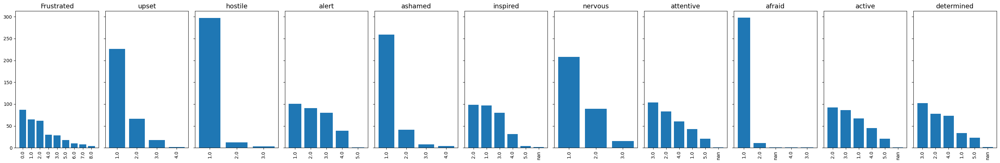

In [6]:
# Feature values
value_counts_per_feature = {
    col: quest_data[col].value_counts(dropna=False)
    for col in quest_data.columns}

# Plot values and NaNs
fig, axes = plt.subplots(1, 11, figsize=(30, 5), sharey=True)
fig.subplots_adjust(wspace=0.5)

for i, col in enumerate(quest_data.columns):
    counts = quest_data[col].value_counts(dropna=False)
    axes[i].bar(counts.index.astype(str), counts.values)
    axes[i].set_title(col, fontsize=14)
    axes[i].tick_params(axis='x', labelrotation=90)

plt.tight_layout()
plt.show()

For the features 'afraid' and 'hsotile', the vast majority answered 1, and these columns are thus dropped. For the remaining NaNs, the observations are dropped instead.

In [7]:
# Remove 'afraid' and 'hostile' columns
quest_data_cleaned = quest_data.drop(columns=[col for col in quest_data.columns if 'afraid' in col or 'hostile' in col])

# Remove rows with remaining NaNs
nan_row_idx_quest = np.where(quest_data_cleaned.isna() == True)[0]
idx_quest_data_cleaned = idx_data.drop(np.unique(nan_row_idx_quest))
quest_data_cleaned = quest_data_cleaned.drop(np.unique(nan_row_idx_quest))

# Convert to integers
quest_data_cleaned = quest_data_cleaned.astype(int)

### Overview

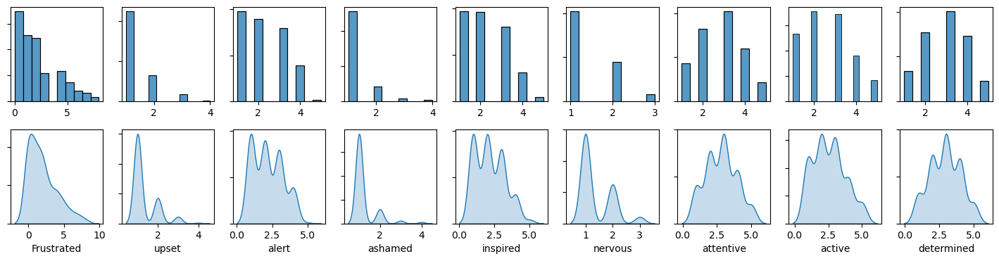

In [8]:
# Plot data distributions
feat = quest_data_cleaned.shape[1]
fig, axes = plt.subplots(2, feat, figsize=(feat*2, 4))
fig.subplots_adjust(hspace=0.3, wspace=0.2)

for j in range(feat):
    sn.histplot(quest_data_cleaned.iloc[:, j], ax=axes[0, j])
    sn.kdeplot(quest_data_cleaned.iloc[:, j], ax=axes[1, j], fill=True)

    axes[0, j].set_xlabel("")
    axes[0, j].set_ylabel("")
    axes[1, j].set_ylabel("")
    axes[0, j].set_yticklabels([])
    axes[1, j].set_yticklabels([])

plt.show()

In [9]:
# Normalize to range from 0 to 1
scaler = MinMaxScaler()
normalized_data = pd.DataFrame(
    scaler.fit_transform(quest_data_cleaned),
    columns=quest_data_cleaned.columns,
    index=quest_data_cleaned.index)

In [10]:
# Define feature data
feature_columns = normalized_data.columns.tolist()
features = normalized_data[feature_columns]

In [11]:
# PCA for visualizing clusters
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features)
normalized_data['PCA1'] = pca_result[:, 0]
normalized_data['PCA2'] = pca_result[:, 1]

## Similarity

### Similarity

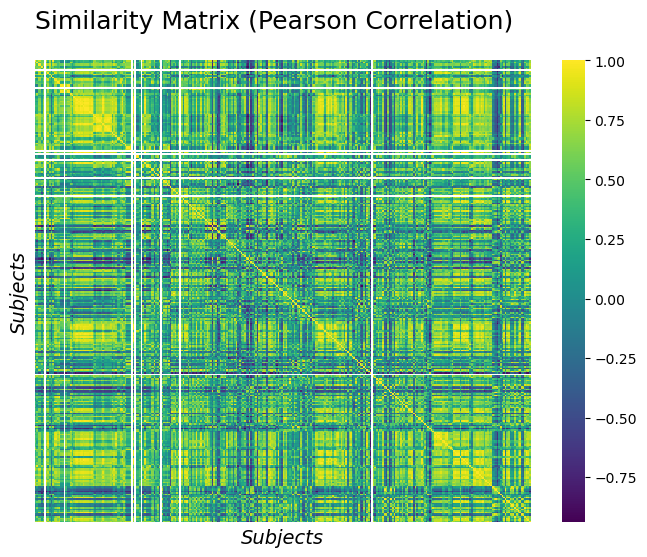

In [12]:
# Similarity matrix using Pearson correlation
similarity_matrix = features.T.corr()

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(similarity_matrix, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Similarity Matrix (Pearson Correlation)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

### Dissimilarity

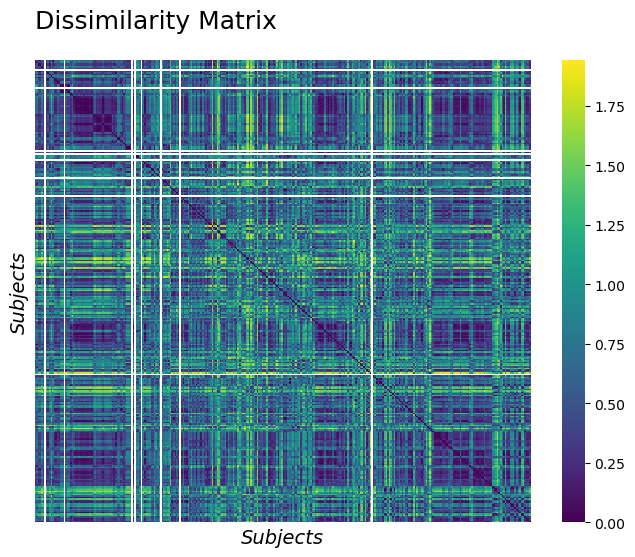

In [13]:
# Dissimilarity matrix
dissimilarity_matrix = 1 - similarity_matrix

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(dissimilarity_matrix, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Dissimilarity Matrix', y=1.1, pad=-10, loc='left', size=18)

plt.show()

## K-means

### Silhouette

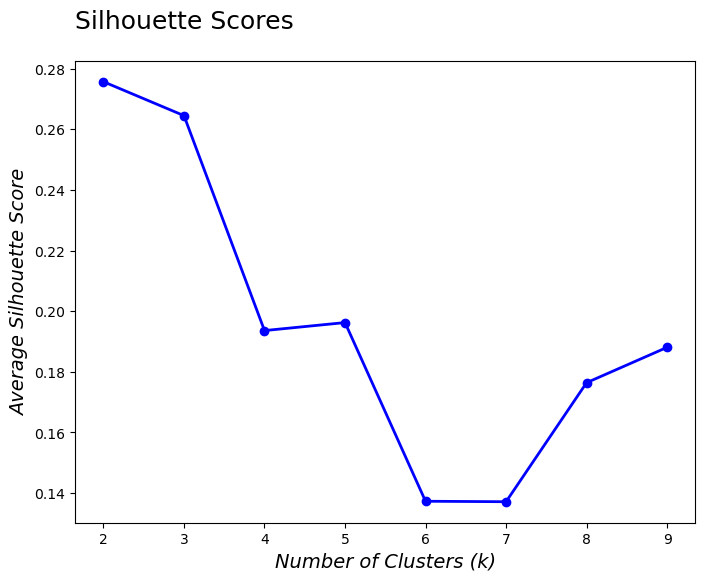

In [14]:
sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    model = KMeans(n_clusters=k, random_state=rdst)
    labels = model.fit_predict(features)
    score = silhouette_score(features, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores', y=1.1, pad=-10, loc='left', size=18)

plt.show()

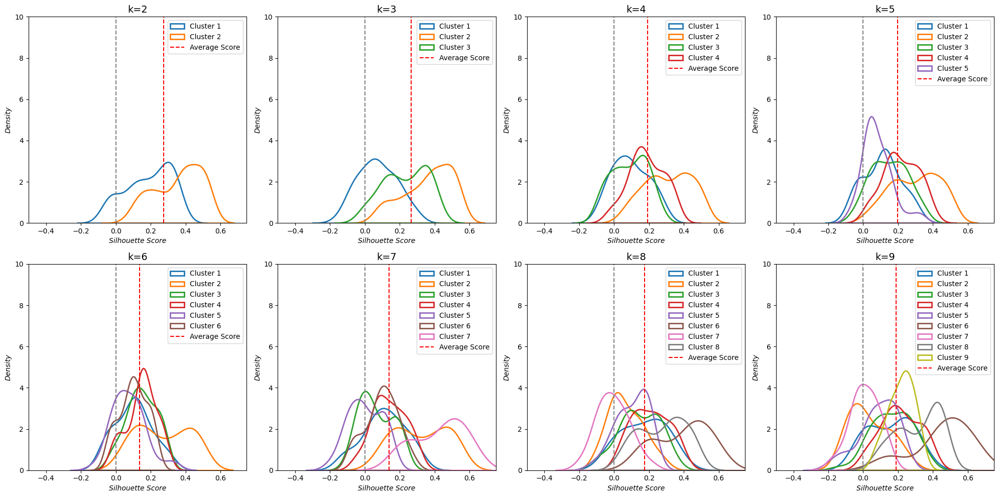

In [15]:
# Set up figure
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Loop through k values
for idx, k in enumerate(k_values):
    row, col = divmod(idx, 4)
    
    # Fit KMeans model for k
    model = KMeans(n_clusters=k, random_state=rdst)
    labels = model.fit_predict(features)
    
    # Calculate silhouette scores
    sil_scores = silhouette_samples(features, labels)
    
    ax = axes[row, col]
    
    # Create separate density plots for each cluster
    for i in range(k):
        cluster_sil_scores = sil_scores[labels == i]
        sn.kdeplot(cluster_sil_scores, ax = ax, shade = True, alpha = 0, lw = 2, label = f'Cluster {i+1}')
    
    # Add average silhouette score
    avg_score = silhouette_score(features, labels)
    ax.axvline(x = avg_score, color = 'red', linestyle = '--', label = 'Average Score')

    # Add silhouette score = 0
    ax.axvline(x = 0, color = 'grey', linestyle = '--')
    
    ax.set_title(f'k={k}', size = 14)
    ax.set_xlim(-0.5, 0.75)
    ax.set_ylim(0, 10)
    ax.set_xlabel('Silhouette Score', size = 10, fontstyle = 'italic')
    ax.set_ylabel('Density', size = 10, fontstyle = 'italic')
    ax.legend()

plt.tight_layout()
plt.show()

### Gap statistics

Optimal number of clusters: 5


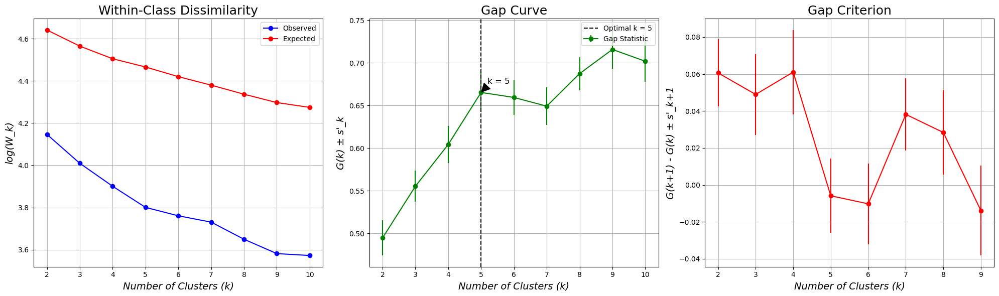

In [16]:
# Compute the gap statistics metrics
n_clusters = 10

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features, n_clusters, references = 20, random_state = rdst, model = KMeans())

print(f'Optimal number of clusters: {k_1se}')

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].axvline(x=k_1se, color='black', linestyle='--', label=f'Optimal k = {k_1se}')
axes[1].annotate(f'k = {k_1se}', 
                 xy=(k_1se, gaps[k_1se - 2]), 
                 xytext=(k_1se + 0.2, gaps[k_1se - 2] + 0.01), 
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=12)
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)
axes[1].legend()

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

### Clustering - optimal k

In [17]:
# Define optimal number of clusters and fit KMeans
n_clusters = k_1se
kmeans = KMeans(n_clusters=n_clusters, random_state=rdst)
normalized_data['cluster_kmeans'] = kmeans.fit_predict(features) +1

# Print table of cluster mean center
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features.columns)
cluster_centers.index = [f'Cluster {i+1}' for i in range(n_clusters)]
display(cluster_centers)

,Frustrated,upset,alert,ashamed,inspired,nervous,attentive,active,determined
Cluster 1,0.720588,0.480392,0.360294,0.313725,0.205882,1.029412e-01,0.455882,0.426471,0.411765
Cluster 2,0.165441,0.049020,0.095588,0.022876,0.098039,1.176471e-01,0.188725,0.095588,0.223039
Cluster 3,0.224138,0.057471,0.616379,0.011494,0.586207,1.982759e-01,0.737069,0.754310,0.793103
Cluster 4,0.162698,0.052910,0.261905,0.021164,0.365079,-8.326673e-17,0.492063,0.436508,0.555556
Cluster 5,0.254902,0.130719,0.362745,0.156863,0.338235,6.372549e-01,0.568627,0.480392,0.583333


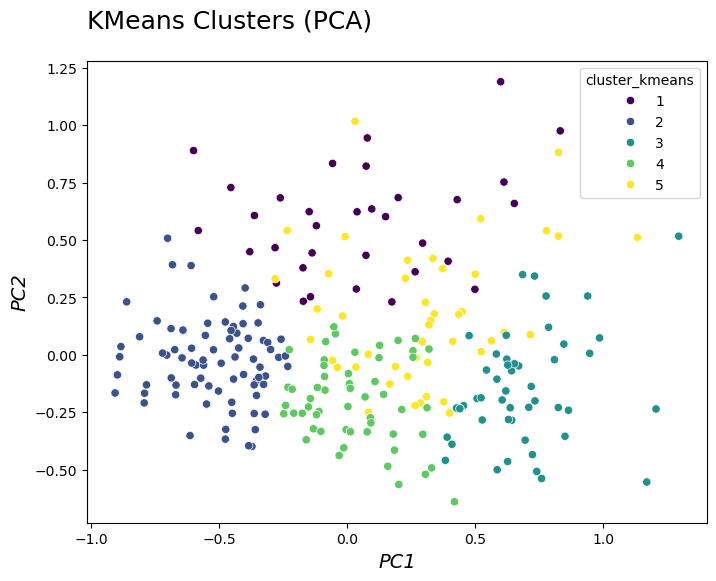

In [18]:
# Plot over principal components
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_kmeans', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

### Clustering - k = 2

In [19]:
# Define optimal number of clusters and fit KMeans
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=rdst)
normalized_data['cluster_2_kmeans'] = kmeans.fit_predict(features) +1

# Print table of cluster mean center
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features.columns)
cluster_centers.index = [f'Cluster {i+1}' for i in range(n_clusters)]
display(cluster_centers)

,Frustrated,upset,alert,ashamed,inspired,nervous,attentive,active,determined
Cluster 1,0.279110,0.139269,0.486301,0.105023,0.458904,0.280822,0.650685,0.616438,0.679795
Cluster 2,0.227623,0.088477,0.134259,0.047325,0.149691,0.114198,0.262346,0.185185,0.297840


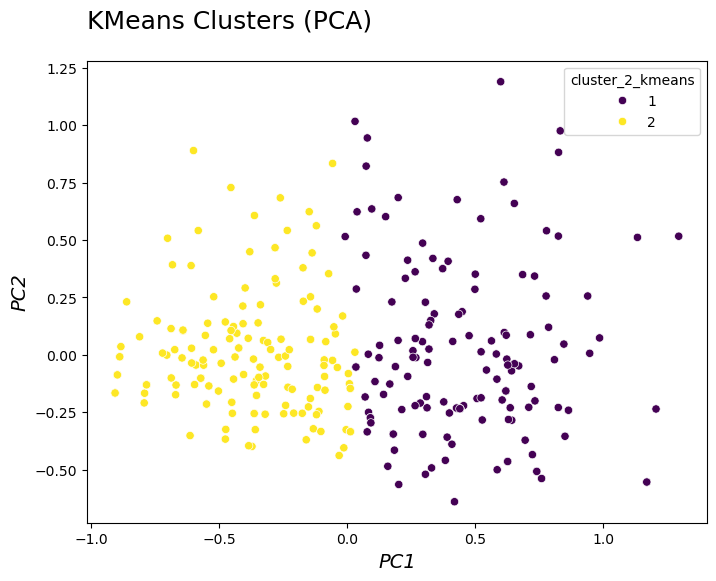

In [20]:
# Plot over principal components
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_2_kmeans', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

## Hierarchical

### Silhouette

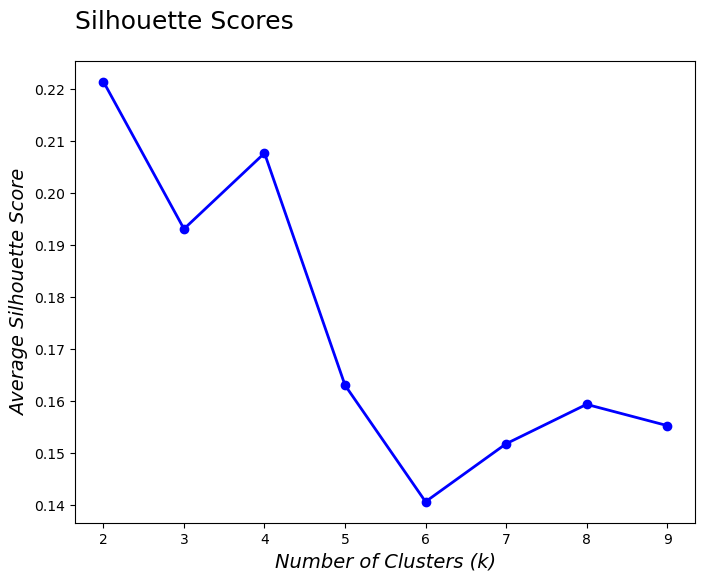

In [21]:
# Linkage matrix
Z = linkage(features, method='ward')

sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    labels = fcluster(Z, k, criterion='maxclust')
    score = silhouette_score(features, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores', y=1.1, pad=-10, loc='left', size=18)

plt.show()

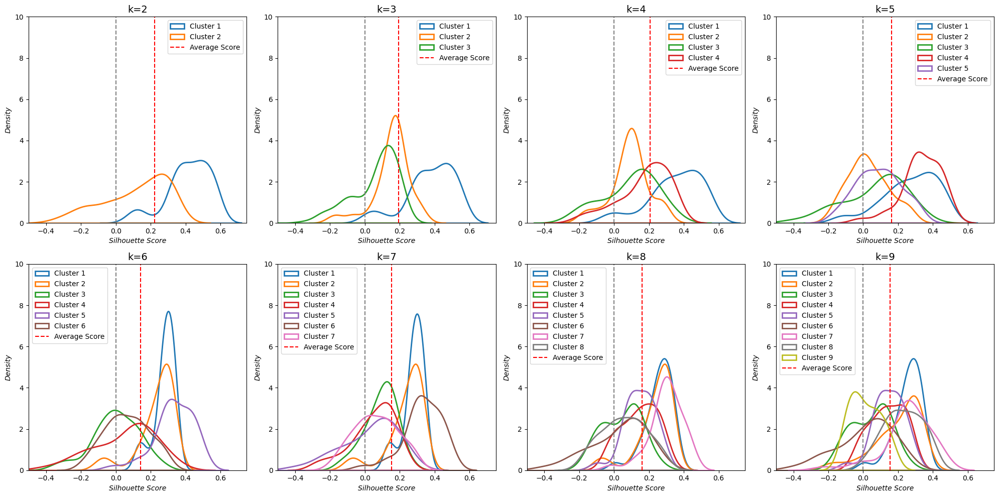

In [22]:
# Set up figure
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Loop through k values
for idx, k in enumerate(k_values):
    row, col = divmod(idx, 4)
    
    # Fit hierarchical model for k
    labels = fcluster(Z, k, criterion='maxclust') -1
    
    # Calculate silhouette scores
    sil_scores = silhouette_samples(features, labels)
    
    ax = axes[row, col]
    
    # Create separate density plots for each cluster
    for i in range(k):
        cluster_sil_scores = sil_scores[labels == i]
        sn.kdeplot(cluster_sil_scores, ax = ax, shade = True, alpha = 0, lw = 2, label = f'Cluster {i+1}')
    
    # Add average silhouette score
    avg_score = silhouette_score(features, labels)
    ax.axvline(x = avg_score, color = 'red', linestyle = '--', label = 'Average Score')

    # Add silhouette score = 0
    ax.axvline(x = 0, color = 'grey', linestyle = '--')
    
    ax.set_title(f'k={k}', size = 14)
    ax.set_xlim(-0.5, 0.75)
    ax.set_ylim(0, 10)
    ax.set_xlabel('Silhouette Score', size = 10, fontstyle = 'italic')
    ax.set_ylabel('Density', size = 10, fontstyle = 'italic')
    ax.legend()

plt.tight_layout()
plt.show()

### Gap statistics

Optimal number of clusters: 9


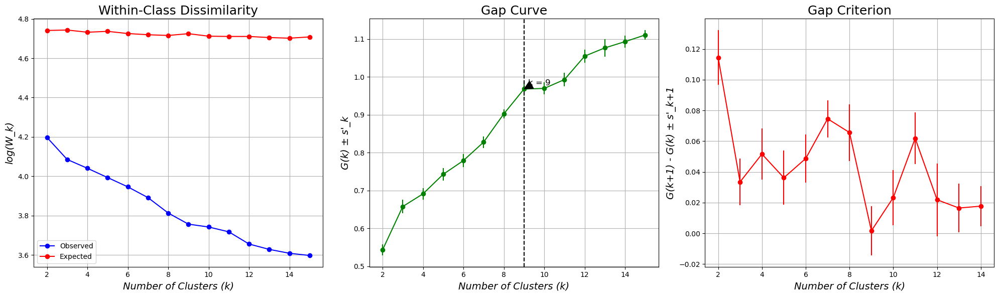

In [23]:
# Compute the gap statistics metrics
n_clusters = 15
hierach_model = HierarchicalModel(method = 'complete', criterion = 'maxclust')

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features, n_clusters, references = 20, random_state = rdst, model = hierach_model)

print(f'Optimal number of clusters: {k_1se}')

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].axvline(x=k_1se, color='black', linestyle='--', label=f'Optimal k = {k_1se}')
axes[1].annotate(f'k = {k_1se}', 
                 xy=(k_1se, gaps[k_1se - 2]), 
                 xytext=(k_1se + 0.2, gaps[k_1se - 2] + 0.01), 
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=12)
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

### Clustering - optimal k

[]

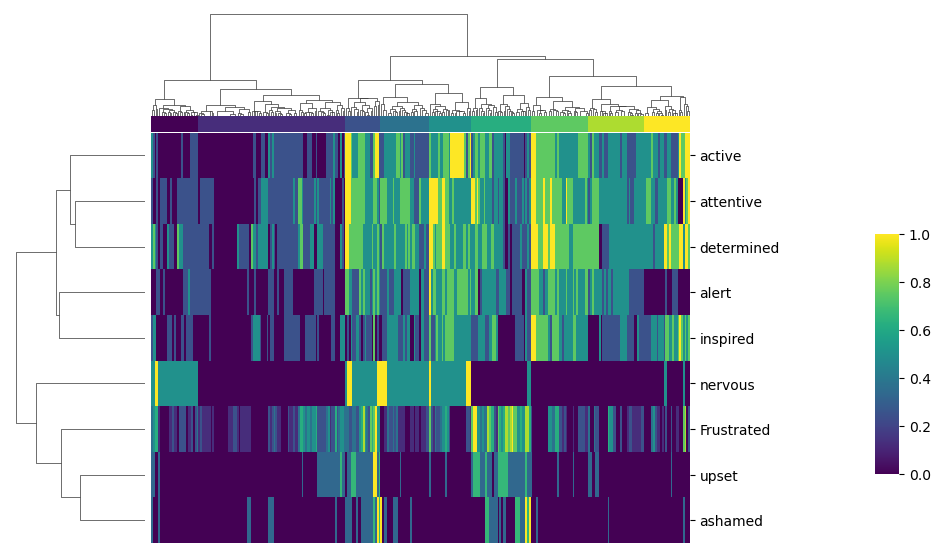

In [24]:
# Define optimal number of clusters and fit Hierarchical clustering
n_clusters = k_1se
labels = fcluster(Z, n_clusters, criterion = 'maxclust')
normalized_data['cluster_2_hierarch'] = labels

# Create a color array based on the labels (one color per cluster)
colors = [plt.cm.get_cmap('viridis', n_clusters) (label-1) for label in labels]

# Plot heatmap with dendrograms
ax_heatmap = sn.clustermap(features.T, cmap = 'viridis',
              col_linkage = Z, col_colors = colors, row_cluster = True,
              figsize = (8, 6), cbar_pos = (1.1, .2, .03, .4))
ax_heatmap.ax_heatmap.set_xticks([])

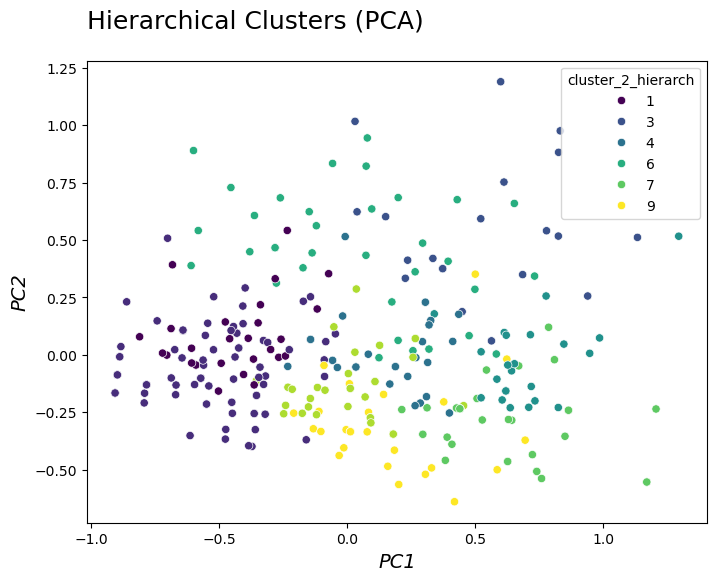

In [25]:
# Plot over principal components
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_2_hierarch', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('Hierarchical Clusters (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

### Clustering - 2

[]

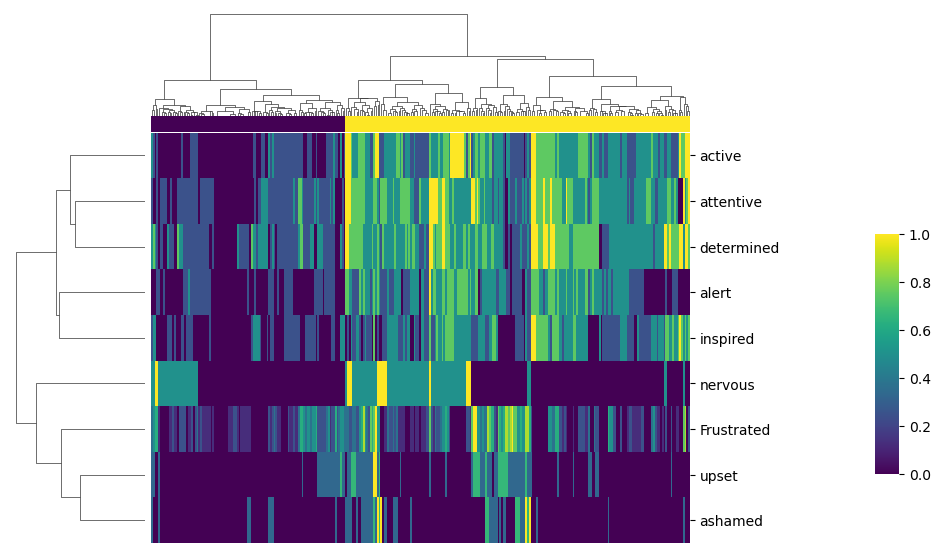

In [26]:
# Define optimal number of clusters and fit Hierarchical clustering
n_clusters = 2
labels = fcluster(Z, n_clusters, criterion = 'maxclust')
normalized_data['cluster_2_hierarch'] = labels

# Create a color array based on the labels (one color per cluster)
colors = [plt.cm.get_cmap('viridis', n_clusters) (label-1) for label in labels]

# Plot heatmap with dendrograms
ax_heatmap = sn.clustermap(features.T, cmap = 'viridis',
              col_linkage = Z, col_colors = colors, row_cluster = True,
              figsize = (8, 6), cbar_pos = (1.1, .2, .03, .4))
ax_heatmap.ax_heatmap.set_xticks([])

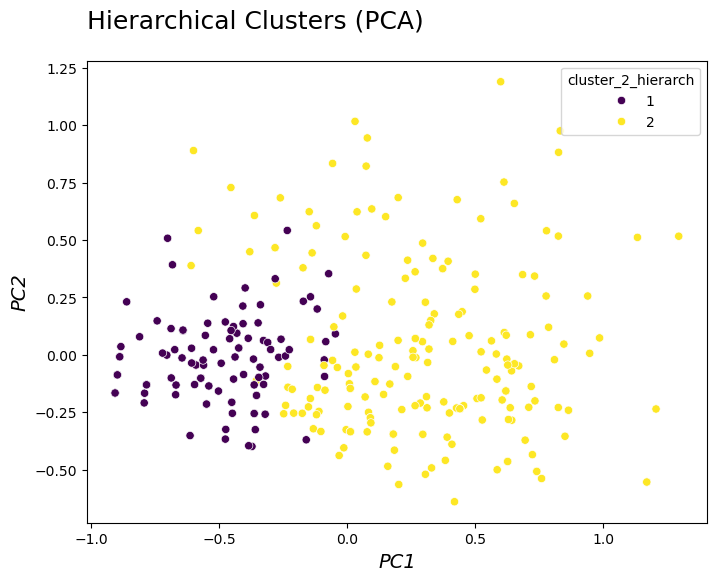

In [27]:
# Plot over principal components
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_2_hierarch', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('Hierarchical Clusters (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

## The clusters

In [28]:
# Save dataframe to csv file
final_quest_data = pd.concat([idx_quest_data_cleaned, normalized_data], axis=1)
final_quest_data.to_csv("data/quest_data.csv", index=False)

### Emotional states

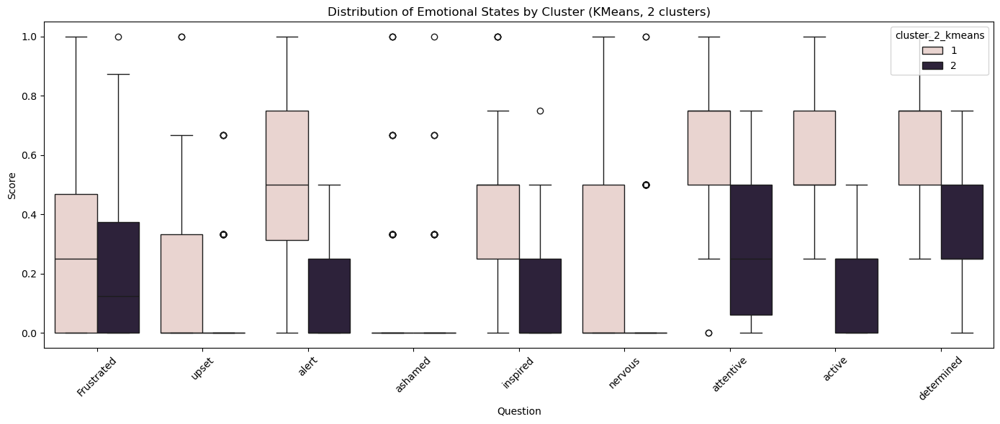

In [29]:
# Boxplots of questionaires for each cluster predicted by kmeans
kmeans_2_melted = pd.melt(normalized_data.reset_index(), 
                 id_vars='cluster_2_kmeans', 
                 value_vars=features.columns,
                 var_name='Question', value_name='Score')

plt.figure(figsize=(14, 6))
sn.boxplot(data = kmeans_2_melted, x = 'Question', y = 'Score', hue = 'cluster_2_kmeans')
plt.title("Distribution of Emotional States by Cluster (KMeans, 2 clusters)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

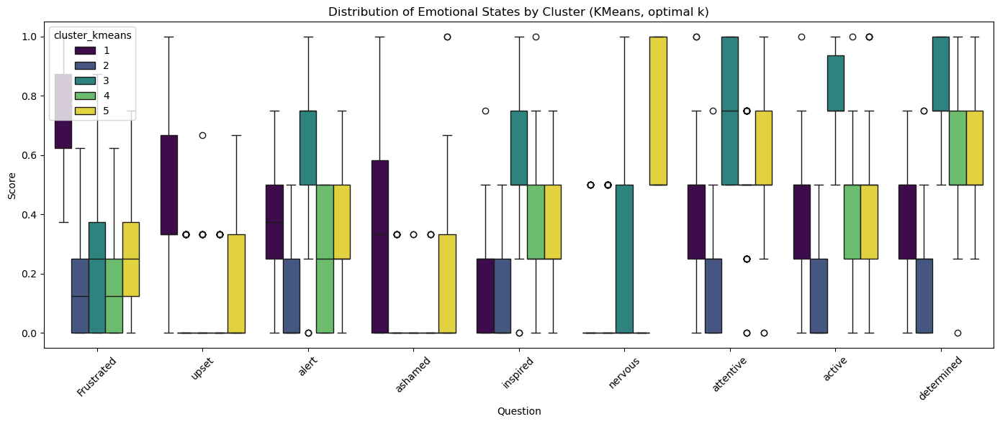

In [30]:
# Boxplots of questionaires for each cluster predicted by kmeans - optimal k
kmeans_melted = pd.melt(normalized_data.reset_index(), 
                 id_vars='cluster_kmeans', 
                 value_vars=features.columns,
                 var_name='Question', value_name='Score')

colors = sn.color_palette("viridis", as_cmap=True)
plt.figure(figsize=(14, 6))
sn.boxplot(data = kmeans_melted, x = 'Question', y = 'Score', hue = 'cluster_kmeans', palette=colors)
plt.title("Distribution of Emotional States by Cluster (KMeans, optimal k)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

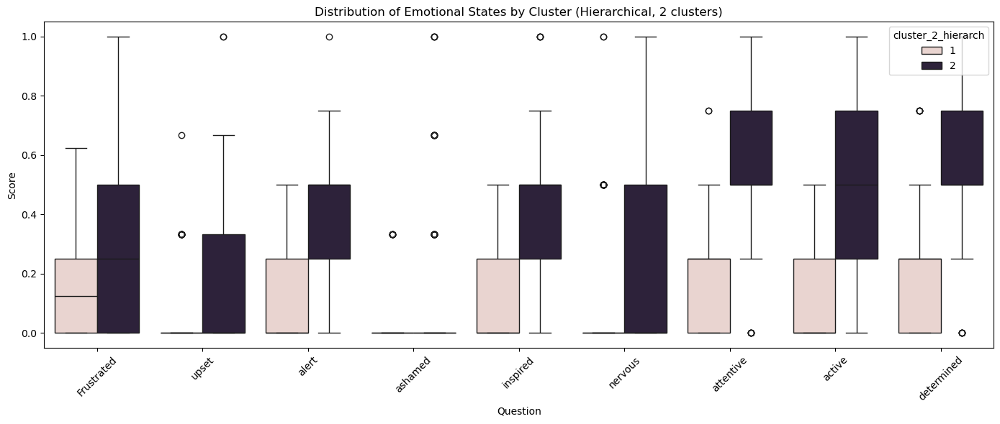

In [31]:
# Boxplots of questionaires for each cluster predicted by hierarchical
hierarch_2_melted = pd.melt(normalized_data.reset_index(), 
                 id_vars='cluster_2_hierarch', 
                 value_vars=features.columns,
                 var_name='Question', value_name='Score')

plt.figure(figsize=(14, 6))
sn.boxplot(data = hierarch_2_melted, x = 'Question', y = 'Score', hue = 'cluster_2_hierarch')
plt.title("Distribution of Emotional States by Cluster (Hierarchical, 2 clusters)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Physiological responses

## Data


### Missing values and odd features

In [32]:
# Combine all physiological columns
phys_data = pd.concat([eda_data, hr_data, temp_data], axis=1)
feature_columns = phys_data.columns.values.tolist()
feat = phys_data.shape[1]

In [33]:
# Locate NaNs
np.where(phys_data.isna() == True)

(array([272, 272]), array([25, 26]))

Only one sample has missing values, and this row is removed.

In [34]:
# Remove rows with NaNs
nan_row_idx_phys = np.where(phys_data.isna() == True)[0]
idx_phys_data_cleaned = idx_data.drop(np.unique(nan_row_idx_phys))
phys_data_cleaned = phys_data.drop(np.unique(nan_row_idx_phys))

### Separate clusters

In [35]:
phys_data_indexed = pd.concat([idx_phys_data_cleaned, phys_data_cleaned], axis=1)
idx_final = final_quest_data.columns[0]
idx_phys = phys_data_indexed.columns[0]
merged = phys_data_indexed.merge(final_quest_data[[idx_final, 'cluster_kmeans']], left_on=idx_phys, right_on=idx_final)

# Create optimal k clusters
n_clusters = merged['cluster_kmeans'].nunique()
clusters = {}
for k in range(n_clusters):
    # Create cluster-specific indexed data
    cluster_indexed = merged[merged['cluster_kmeans'] == k+1]
    cluster_phys_data = cluster_indexed[feature_columns]
    
    # Print number of samples in cluster
    print(f'Samples in Cluster {k+1}: {cluster_phys_data.shape[0]}')
    
    # Store cluster data
    clusters[k] = cluster_phys_data

Samples in Cluster 1: 34
Samples in Cluster 2: 102
Samples in Cluster 3: 58
Samples in Cluster 4: 62
Samples in Cluster 5: 51


### Density plots

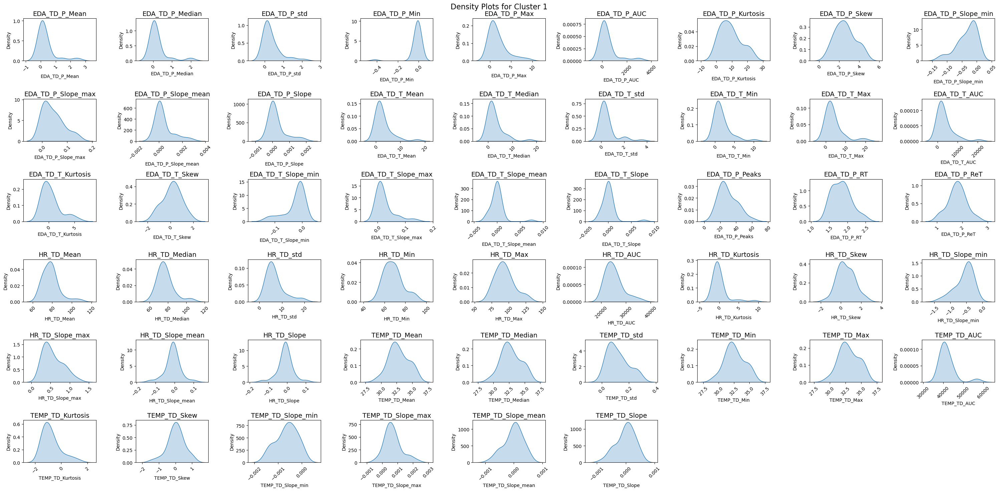

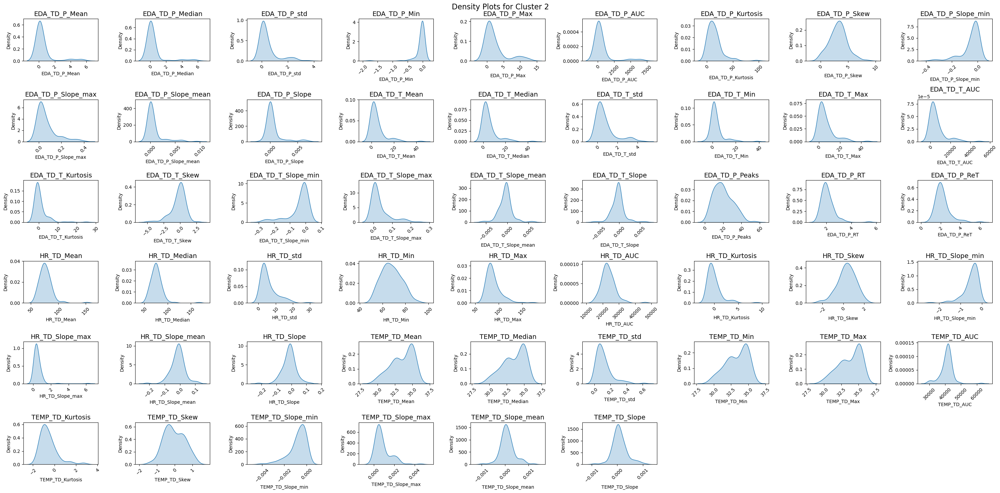

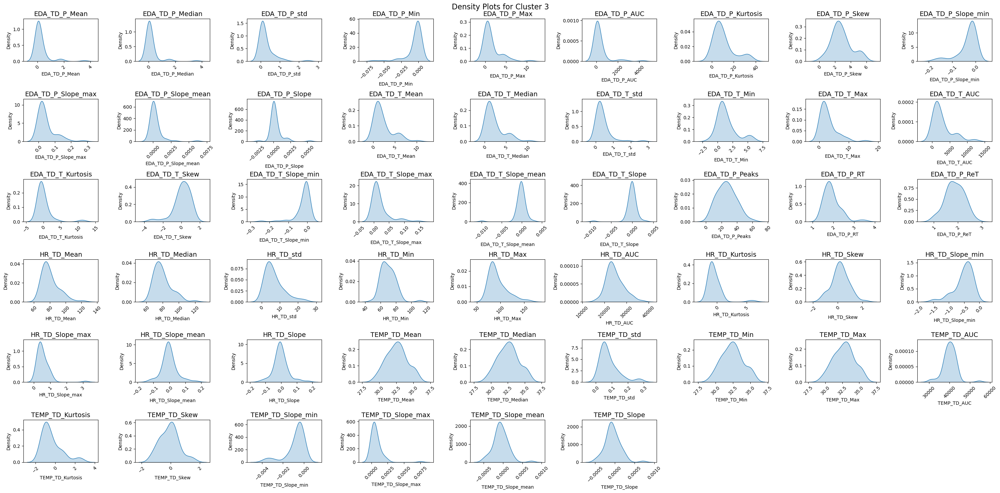

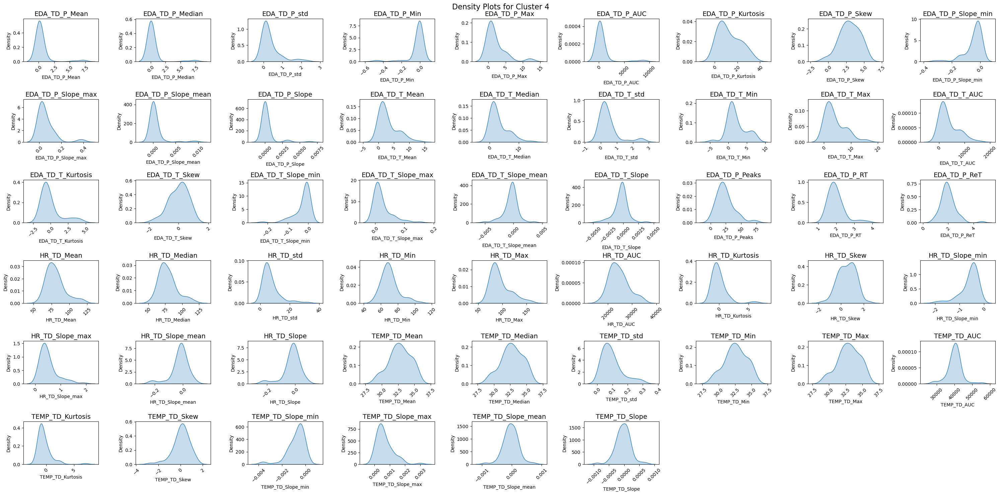

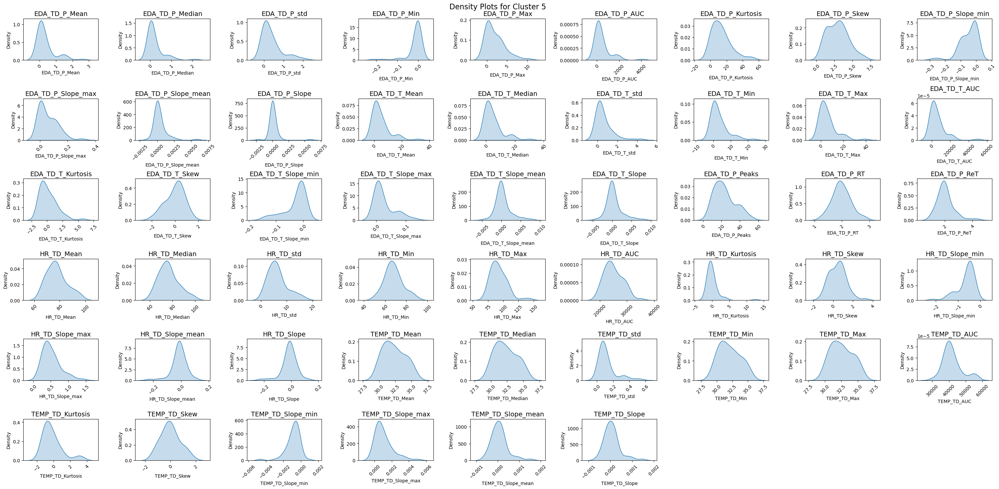

In [36]:
# Set number of rows and columns for the grid of plots
rows, cols = 6, 9

# Loop through each cluster based on n_cluster
for k in range(n_clusters):
    # Get data for the current cluster
    cluster_phys_data = clusters[k]

    # Create subplots for the current cluster
    fig, axes = plt.subplots(rows, cols, figsize=(30, 15), sharey=False)
    axes = axes.flatten()
    fig.subplots_adjust(wspace=0.5)

    # Create KDE plots for each feature in the current cluster
    for i in range(len(cluster_phys_data.columns)):
        sn.kdeplot(cluster_phys_data.iloc[:, i], ax=axes[i], fill=True)
        axes[i].set_title(cluster_phys_data.columns[i], fontsize=14)
        axes[i].tick_params(axis='x', labelrotation=45)

    # Remove unused subplots if the number of features is less than the grid size
    for j in range(len(cluster_phys_data.columns), len(axes)):
        axes[j].axis('off')

    plt.suptitle(f'Density Plots for Cluster {k+1}', fontsize=16)
    plt.tight_layout()
    plt.show()

### Scaling

In [37]:
# Normalize the data (scaling each feature to range [0, 1]) and define feature data
scaler = MinMaxScaler()
normalized_phys_data = pd.DataFrame(
    scaler.fit_transform(phys_data_cleaned),
    columns=phys_data_cleaned.columns,
    index=phys_data_cleaned.index)
features_all = normalized_phys_data[feature_columns]

normalized_clusters = {}
features_all_clusters = {}

for k in range(n_clusters):
    cluster_phys_data = clusters[k]
    normalized_data = pd.DataFrame(
        scaler.fit_transform(cluster_phys_data),
        columns=cluster_phys_data.columns,
        index=cluster_phys_data.index)
    normalized_clusters[k] = normalized_data

    features_cluster_k = normalized_clusters[k][feature_columns]
    features_all_clusters[k] = features_cluster_k

### PCA

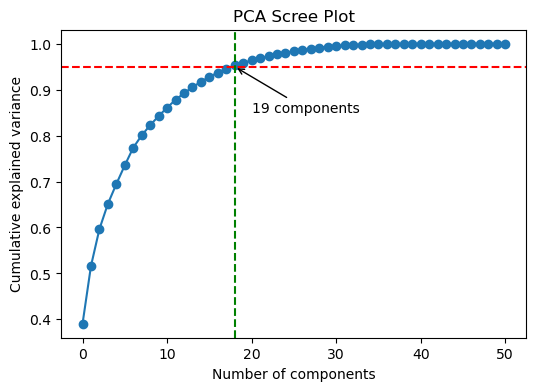

In [38]:
# PCA for visualizing clusters
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features_all)
normalized_phys_data['PCA1'] = pca_result[:, 0]
normalized_phys_data['PCA2'] = pca_result[:, 1]

pca_results_all_clusters = {}

for k in range(n_clusters):
    features_cluster_k = features_all_clusters[k]
    pca_result_cluster_k = pca.fit_transform(features_cluster_k)
    normalized_clusters[k]['PCA1'] = pca_result_cluster_k[:, 0]
    normalized_clusters[k]['PCA2'] = pca_result_cluster_k[:, 1]
    pca_results_all_clusters[k] = normalized_clusters[k]

# Scree plot of overall data
pca2 = PCA(n_components=feat)
pca2_results = pca2.fit_transform(features_all)

cum_var = np.cumsum(pca2.explained_variance_ratio_)
n_95 = np.argmax(cum_var >= 0.95) + 1

plt.figure(figsize=(6, 4))
plt.plot(cum_var, marker='o')

plt.axhline(y=0.95, color='r', linestyle='--', label='95% variance')
plt.axvline(x=n_95 - 1, color='g', linestyle='--', label=f'{n_95} components')
plt.annotate(f"{n_95} components", xy=(n_95 - 1, 0.95), xytext=(n_95 + 1, 0.85), arrowprops=dict(arrowstyle='->', color='black'), fontsize=10)

plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.title("PCA Scree Plot")
plt.show()


## Similarity

### Similarity

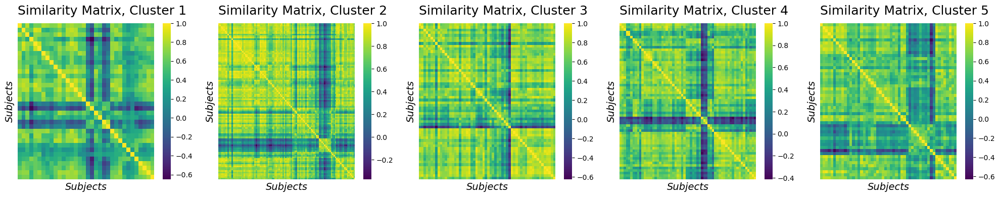

In [39]:
# Set up the figure with subplots, adjusting the number of rows and columns based on the number of clusters
fig, axes = plt.subplots(1, n_clusters, figsize=(20, 4))

for k in range(n_clusters):
    features_cluster_k = features_all_clusters[k]
    similarity_matrix_k = features_cluster_k.T.corr()
    ax = axes[k]
    sn.heatmap(similarity_matrix_k, cmap='viridis', annot=False, ax=ax)
    
    # Set plot labels and title
    ax.set_ylabel("Subjects", size=14, fontstyle='italic')
    ax.set_xlabel("Subjects", size=14, fontstyle='italic')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Similarity Matrix, Cluster {k+1}', y=1.1, pad=-10, loc='left', size=18)

# Adjust layout
plt.tight_layout()
plt.show()

### Dissimilarity

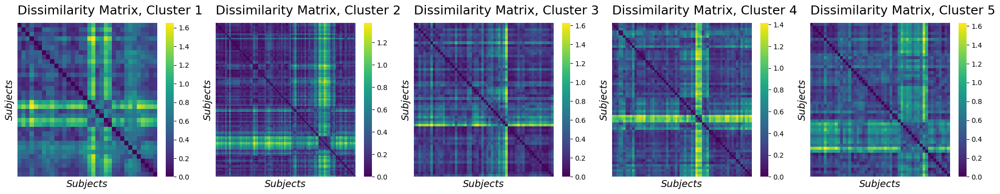

In [40]:
# Set up the figure with subplots, adjusting the number of rows and columns based on the number of clusters
fig, axes = plt.subplots(1, n_clusters, figsize=(20, 4))

for k in range(n_clusters):
    features_cluster_k = features_all_clusters[k]
    similarity_matrix_k = features_cluster_k.T.corr()
    dissimilarity_matrix_k = 1 - similarity_matrix_k
    ax = axes[k]
    sn.heatmap(dissimilarity_matrix_k, cmap='viridis', annot=False, ax=ax)
    
    # Set plot labels and title
    ax.set_ylabel("Subjects", size=14, fontstyle='italic')
    ax.set_xlabel("Subjects", size=14, fontstyle='italic')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Dissimilarity Matrix, Cluster {k+1}', y=1.1, pad=-10, loc='left', size=18)

# Adjust layout
plt.tight_layout()
plt.show()

## Kmeans

### Silhouette

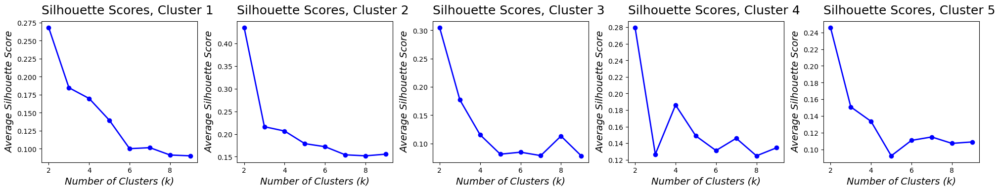

In [41]:
# Set up the figure with subplots, adjusting the number of rows and columns
fig, axes = plt.subplots(1, n_clusters, figsize=(20, 4))

for k in range(n_clusters):
    features_cluster_k = features_all_clusters[k]
    sil_scores = []
    k_values = range(2, 10)
    
    for k_val in k_values:
        model = KMeans(n_clusters=k_val, random_state=rdst)
        labels = model.fit_predict(features_cluster_k)
        score = silhouette_score(features_cluster_k, labels)
        sil_scores.append(score)
    
    ax = axes[k]
    ax.plot(k_values, sil_scores, 'bo-', linewidth=2)
    ax.set_xlabel("Number of Clusters (k)", size=14, fontstyle='italic')
    ax.set_ylabel("Average Silhouette Score", size=14, fontstyle='italic')
    ax.set_title(f'Silhouette Scores, Cluster {k+1}', y=1.1, pad=-10, loc='left', size=18)

plt.tight_layout()
plt.show()

### Gap statistics

Optimal number of clusters for cluster 1: 3
Optimal number of clusters for cluster 2: 10
Optimal number of clusters for cluster 3: 4
Optimal number of clusters for cluster 4: 4
Optimal number of clusters for cluster 5: 3


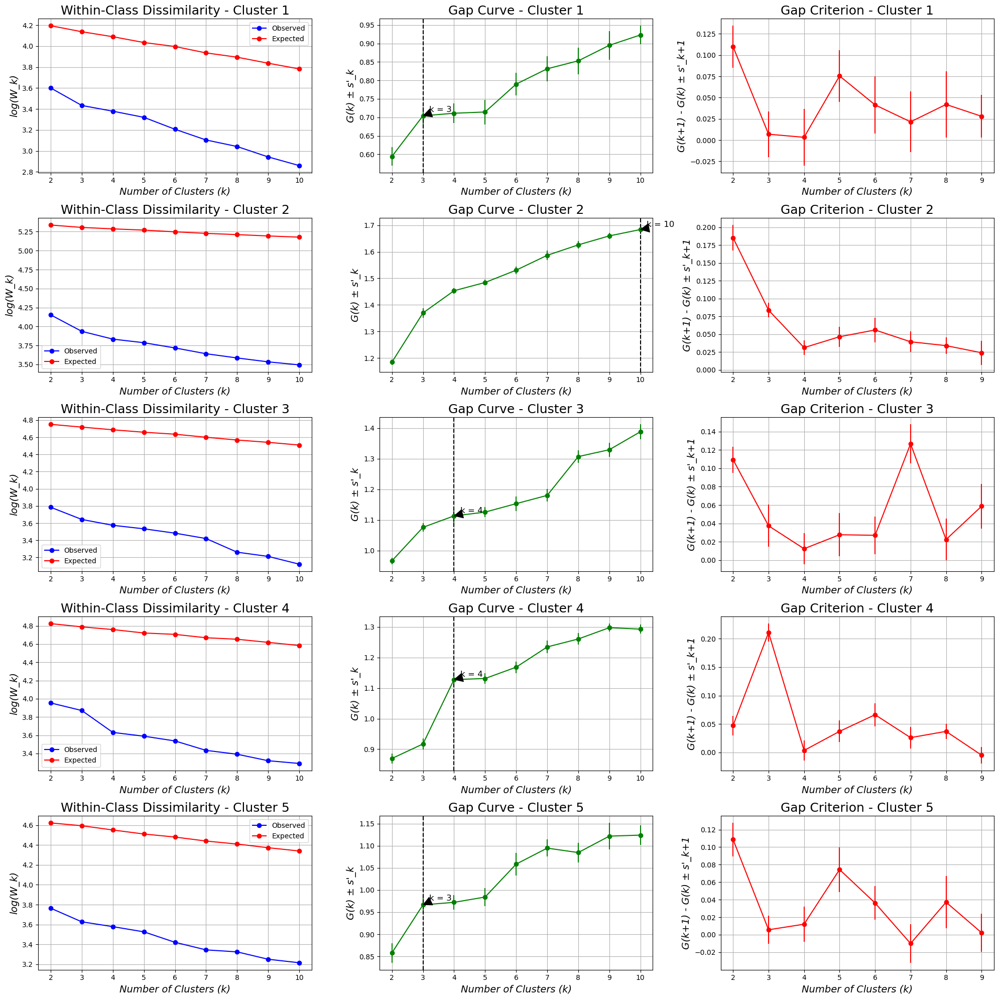

In [42]:
k_clusters = 10
optimal_clusters = {}

# Set figure with 3 cols and n clusters rows
fig, axes = plt.subplots(n_clusters, 3, figsize=(20, 4 * n_clusters))

for cluster_idx in range(n_clusters):
    features_cluster_k = features_all_clusters[cluster_idx]
    
    (log_wk,
     expected_log_wk,
     gaps,
     gap_diff,
     s_k_ref,
     s_prime_k,
     k_1se) = gap_statistics(features_cluster_k, k_clusters, references=20, random_state=rdst, model=KMeans())
    
    optimal_clusters[cluster_idx] = k_1se
    print(f'Optimal number of clusters for cluster {cluster_idx+1}: {k_1se}')

    # Plot 1: Within-Class Dissimilarity
    axes[cluster_idx, 0].plot(range(2, k_clusters + 1), log_wk, marker='o', color='b', label='Observed')
    axes[cluster_idx, 0].plot(range(2, k_clusters + 1), expected_log_wk, marker='o', color='r', label='Expected')
    axes[cluster_idx, 0].set_title(f'Within-Class Dissimilarity - Cluster {cluster_idx + 1}', size=18)
    axes[cluster_idx, 0].set_xlabel('Number of Clusters (k)', size=14, fontstyle='italic')
    axes[cluster_idx, 0].set_ylabel('log(W_k)', size=14, fontstyle='italic')
    axes[cluster_idx, 0].grid(True)
    axes[cluster_idx, 0].legend()

    # Plot 2: Gap Curve
    axes[cluster_idx, 1].errorbar(range(2, k_clusters + 1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
    axes[cluster_idx, 1].axvline(x=k_1se, color='black', linestyle='--', label=f'Optimal k = {k_1se}')
    axes[cluster_idx, 1].annotate(f'k = {k_1se}', 
                 xy=(k_1se, gaps[k_1se - 2]), 
                 xytext=(k_1se + 0.2, gaps[k_1se - 2] + 0.01), 
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=12)
    axes[cluster_idx, 1].set_title(f'Gap Curve - Cluster {cluster_idx + 1}', size=18)
    axes[cluster_idx, 1].set_xlabel('Number of Clusters (k)', size=14, fontstyle='italic')
    axes[cluster_idx, 1].set_ylabel('G(k) ± s\'_k', size=14, fontstyle='italic')
    axes[cluster_idx, 1].grid(True)

    # Plot 3: Gap Criterion
    axes[cluster_idx, 2].errorbar(range(2, k_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
    axes[cluster_idx, 2].set_title(f'Gap Criterion - Cluster {cluster_idx + 1}', size=18)
    axes[cluster_idx, 2].set_xlabel('Number of Clusters (k)', size=14, fontstyle='italic')
    axes[cluster_idx, 2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size=14, fontstyle='italic')
    axes[cluster_idx, 2].grid(True)

plt.tight_layout()
plt.show()

### Clustering - k = 2

Mean centers for Cluster 1:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.036457,0.023708,0.060116,0.972584,0.088321,0.038419,0.476262,0.538554,0.848351,0.188994,...,0.474254,0.449016,0.506410,0.224061,0.250099,0.612673,0.525895,0.431833,0.591087,0.587667
Cluster 2,0.463993,0.416065,0.503476,0.867094,0.559907,0.462917,0.164630,0.262179,0.341542,0.695401,...,0.162446,0.768065,0.785927,0.211103,0.371023,0.516556,0.689667,0.311001,0.673951,0.659042


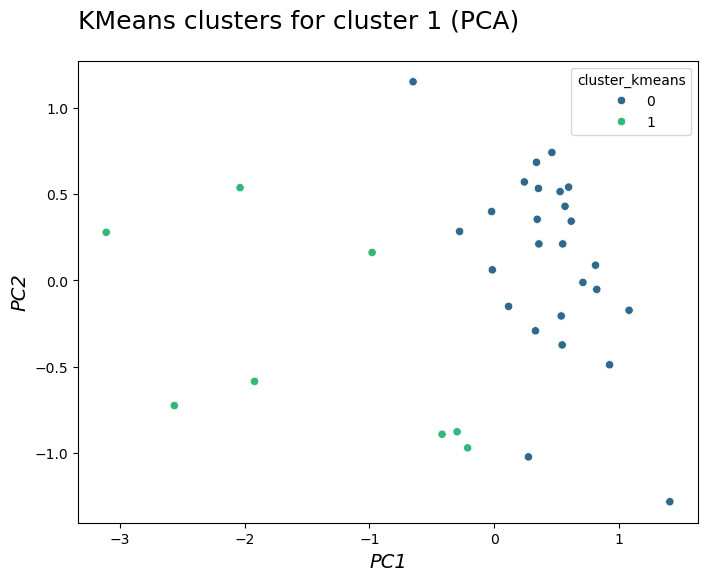

Mean centers for Cluster 2:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.023979,0.009999,0.062642,0.975341,0.102034,0.024044,0.176527,0.427808,0.912013,0.102975,...,0.168649,0.591303,0.624055,0.336297,0.224563,0.553733,0.798569,0.215333,0.489915,0.501437
Cluster 2,0.695853,0.616283,0.677453,0.860446,0.833217,0.700659,0.018536,0.106117,0.367653,0.696369,...,0.165171,0.856886,0.904712,0.388850,0.292701,0.419656,0.654823,0.265182,0.460098,0.484987


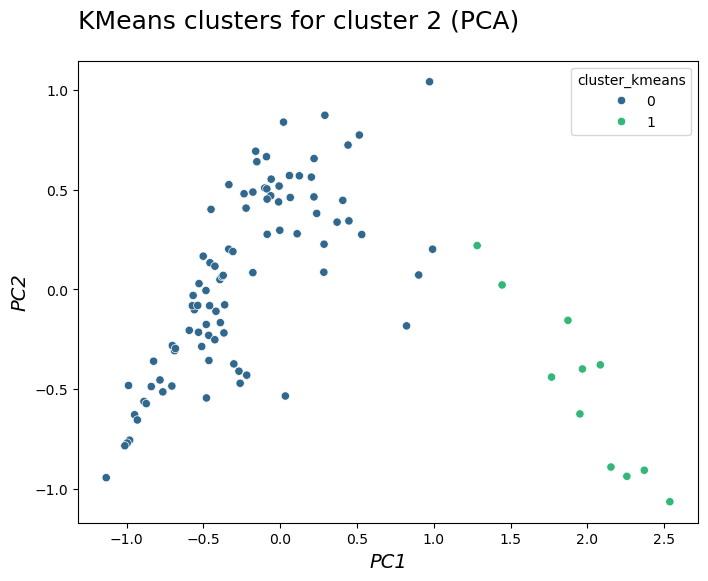

Mean centers for Cluster 3:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.020732,0.009028,0.043431,0.919658,0.058614,0.021091,0.320433,0.486148,0.910272,0.084031,...,0.275637,0.437387,0.439947,0.365693,0.258100,0.437488,0.751166,0.110637,0.351682,0.360092
Cluster 2,0.280241,0.232470,0.345487,0.902314,0.438156,0.295685,0.257149,0.370997,0.449360,0.454780,...,0.175463,0.880353,0.848007,0.541608,0.335341,0.375950,0.830767,0.059209,0.352817,0.351652


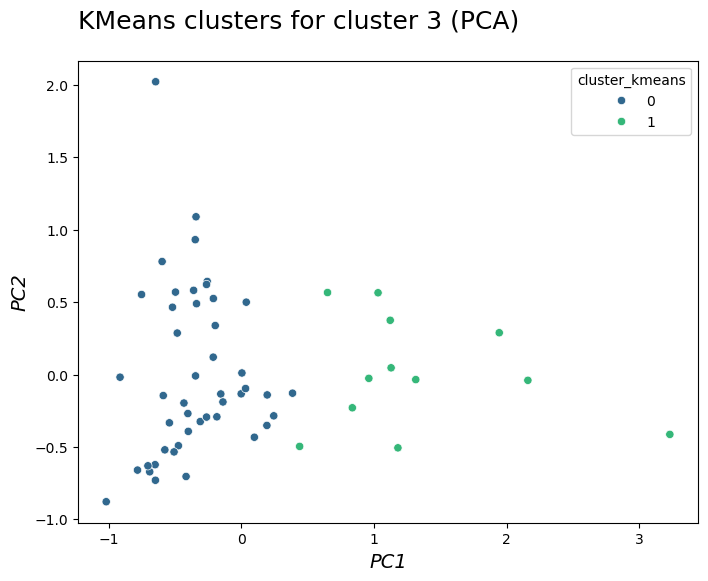

Mean centers for Cluster 4:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.011726,0.005605,0.054065,0.989413,0.066871,0.011777,0.415461,0.629267,0.936012,0.066384,...,0.308043,0.445545,0.473305,0.416117,0.166888,0.664246,0.727030,0.241962,0.512870,0.522797
Cluster 2,0.229905,0.188655,0.428213,0.787801,0.473725,0.225875,0.310500,0.494778,0.628434,0.405647,...,0.146091,0.854201,0.866889,0.501172,0.118616,0.712801,0.783786,0.173569,0.569805,0.563731


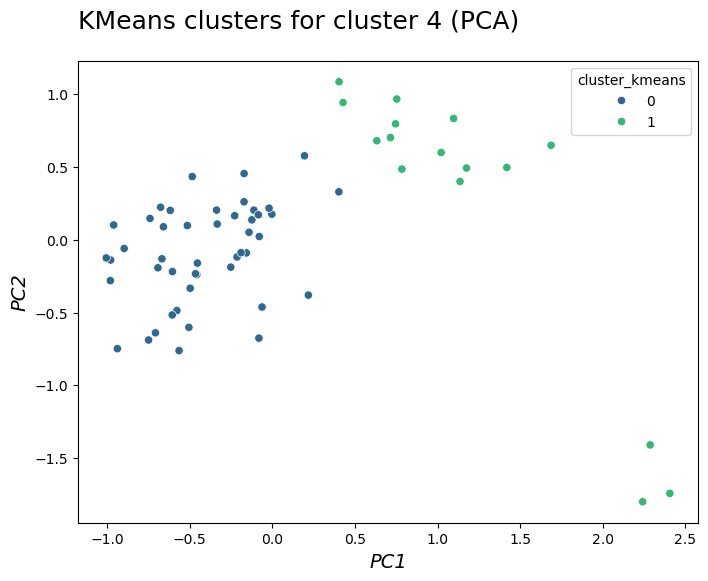

Mean centers for Cluster 5:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.021354,0.006550,0.052294,0.966258,0.070634,0.017199,0.362503,0.480650,0.936909,0.065851,...,0.223175,0.288664,0.294735,0.404919,0.354024,0.434567,0.633433,0.247597,0.298601,0.315981
Cluster 2,0.328409,0.265035,0.407560,0.866616,0.409664,0.270204,0.095124,0.185323,0.630912,0.419505,...,0.176382,0.741452,0.760454,0.498977,0.182663,0.473777,0.767697,0.165386,0.344760,0.366933


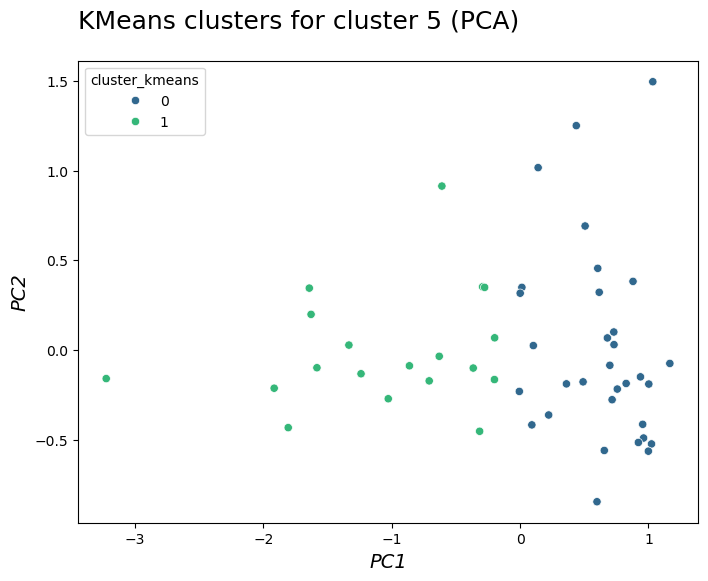

In [43]:
# Print cluster centers and project onto PCA coordinates
for cluster_idx, clusters in optimal_clusters.items():
    
    # Perform KMeans with optimal_clusters data
    kmeans = KMeans(n_clusters = 2, random_state = rdst)
    normalized_clusters_k = normalized_clusters[cluster_idx].copy()
    normalized_clusters_k['cluster_kmeans'] = kmeans.fit_predict(features_all_clusters[cluster_idx])

    # Compute and print cluster centers
    k_centers = pd.DataFrame(kmeans.cluster_centers_, columns = features_all_clusters[cluster_idx].columns)
    k_centers.index = [f'Cluster {i+1}' for i in range(2)]
    print(f"Mean centers for Cluster {cluster_idx + 1}:")
    display(k_centers)

    # Add PCA components to the dataframe
    pca_result = pca_results_all_clusters[cluster_idx]
    normalized_clusters_k['PCA1'] = pca_result['PCA1']
    normalized_clusters_k['PCA2'] = pca_result['PCA2']
    
    # Plot clusters over PC1 and PC2
    fig, ax = plt.subplots(figsize=(8, 6))
    sn.scatterplot(data=normalized_clusters_k, x='PCA1', y='PCA2', hue='cluster_kmeans', palette='viridis')
    ax.set_xlabel('PC1', size=14, fontstyle='italic')
    ax.set_ylabel('PC2', size=14, fontstyle='italic')
    ax.set_title(f'KMeans clusters for cluster {cluster_idx + 1} (PCA)', y=1.1, pad=-10, loc='left', size=18)

    plt.show()

### Clustering - optimal k

Mean centers for Cluster 1:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.035373,0.023010,0.058334,0.975264,0.084607,0.037393,0.475942,0.538893,0.859509,0.175642,...,0.484521,0.449900,0.508980,0.228072,0.255815,0.612316,0.526570,0.431367,0.587072,0.582319
Cluster 2,0.153746,0.087607,0.262537,0.770948,0.324891,0.154750,0.317181,0.446347,0.509236,0.551546,...,0.200171,0.584385,0.600000,0.164310,0.239572,0.581607,0.667769,0.356955,0.693456,0.686662
Cluster 3,0.751694,0.732909,0.704944,0.996898,0.758995,0.748414,0.053852,0.098944,0.188890,0.832068,...,0.129076,0.912375,0.932398,0.247763,0.469382,0.461503,0.671875,0.286679,0.653944,0.640099


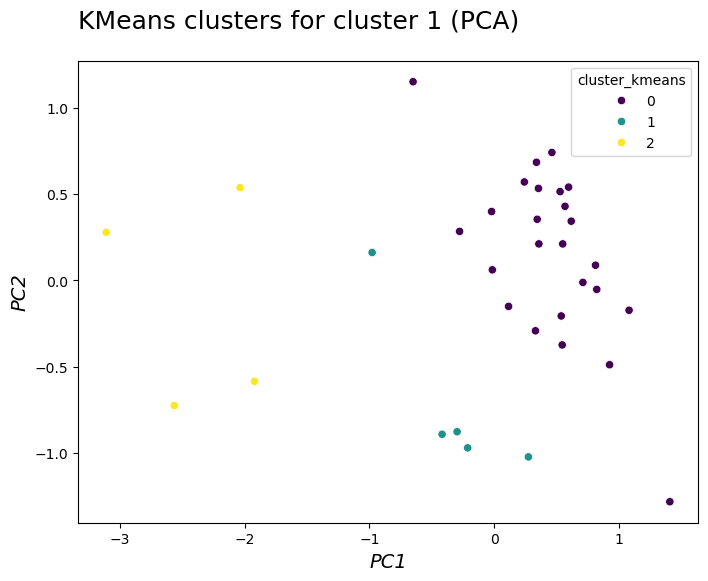

Mean centers for Cluster 2:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.016110,0.006098,0.041699,0.995241,0.069183,0.015995,0.139521,0.388412,0.937048,0.076439,...,0.125472,0.506424,0.526459,0.318780,0.238092,0.435882,0.742070,0.196838,0.402925,0.411472
Cluster 2,0.838844,0.793046,0.688500,0.808113,0.852649,0.845057,0.003647,0.048435,0.317720,0.696953,...,0.150177,0.864274,0.912998,0.393274,0.382490,0.350139,0.639168,0.270041,0.441595,0.458923
Cluster 3,0.004083,0.001356,0.011931,0.998724,0.020736,0.003723,0.261644,0.516301,0.983536,0.022897,...,0.133239,0.207226,0.226438,0.221794,0.224024,0.544930,0.811654,0.172564,0.434833,0.436614
Cluster 4,0.058053,0.037403,0.112545,0.943414,0.167310,0.058579,0.096113,0.326783,0.875064,0.148465,...,0.115670,0.916392,0.931894,0.397442,0.249143,0.521187,0.922596,0.135131,0.521171,0.544788
Cluster 5,0.004213,0.000498,0.018263,0.985230,0.038296,0.004285,0.270936,0.553356,0.972940,0.033510,...,0.602141,0.633870,0.803364,0.368309,0.131391,0.532696,0.539805,0.555880,0.765340,0.791441
Cluster 6,0.007768,0.001086,0.038030,0.989341,0.108095,0.007816,0.544936,0.795918,0.863686,0.121906,...,0.062434,0.854785,0.853821,0.380732,0.136135,0.556643,0.977778,0.115700,0.524965,0.524320
Cluster 7,0.025036,0.008155,0.067977,0.962905,0.119383,0.025798,0.145853,0.392519,0.885043,0.124340,...,0.104219,0.839784,0.853745,0.418864,0.264634,0.679746,0.893218,0.150192,0.507254,0.522710
Cluster 8,0.249233,0.125527,0.498173,0.966290,0.633914,0.248414,0.067691,0.279441,0.623575,0.593312,...,0.252165,0.828383,0.885050,0.354744,0.055294,0.629270,0.783496,0.254952,0.582449,0.616740
Cluster 9,0.069519,0.005034,0.325383,0.788829,0.499328,0.070054,0.141371,0.429489,0.588869,0.403860,...,0.130535,0.837184,0.855482,0.380823,0.147044,0.645255,0.822902,0.251869,0.490490,0.502638
Cluster 10,0.100908,0.048239,0.214107,1.000000,0.292962,0.101422,0.050204,0.260267,0.659022,0.342700,...,0.199452,0.825083,0.873754,0.375597,0.225149,0.832294,0.845668,0.426842,0.624412,0.630763


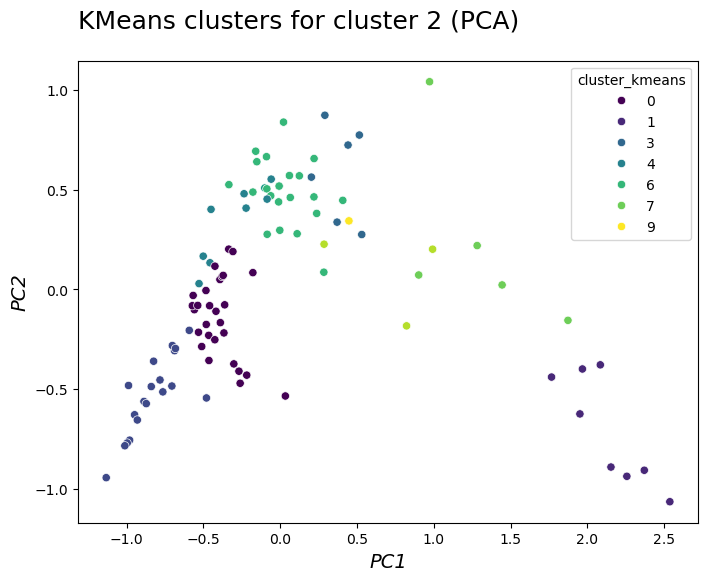

Mean centers for Cluster 3:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.010560,0.004460,0.025181,0.872016,0.039190,0.010654,0.449881,0.594865,0.936815,0.059651,...,0.210002,0.226563,0.225083,0.305029,0.163833,0.426814,0.873043,0.055447,0.388443,0.391774
Cluster 2,0.045107,0.021943,0.097860,0.926196,0.143564,0.045671,0.302791,0.474933,0.801469,0.190330,...,0.203943,0.644737,0.623885,0.411712,0.193617,0.385002,0.847108,0.075065,0.385912,0.389281
Cluster 3,0.019883,0.008793,0.038866,0.922142,0.047781,0.020485,0.262922,0.435605,0.919204,0.068542,...,0.397963,0.549696,0.572259,0.414444,0.416240,0.495030,0.539825,0.188596,0.267722,0.286347
Cluster 4,0.424632,0.367994,0.465655,0.975395,0.547834,0.450349,0.095402,0.186218,0.334376,0.522203,...,0.168925,0.859127,0.828904,0.569585,0.419544,0.367325,0.831702,0.066986,0.368600,0.362535


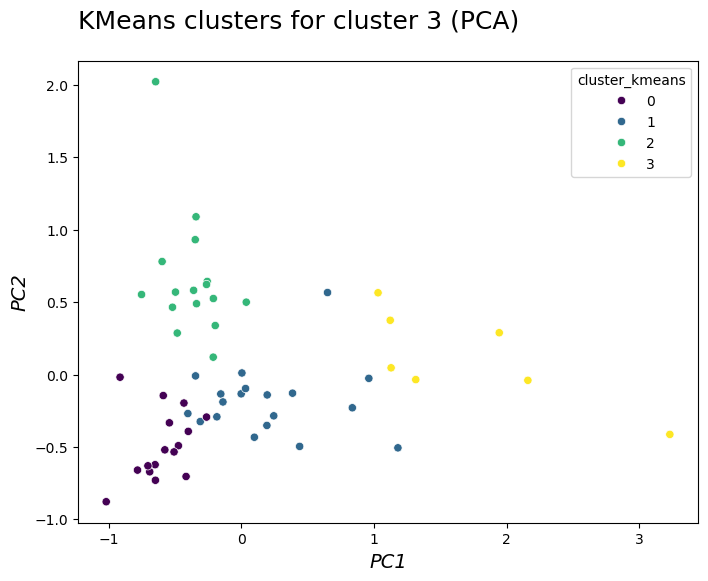

Mean centers for Cluster 4:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.008007,0.003008,0.042773,0.986856,0.055943,0.008206,0.437844,0.640201,0.944711,0.054940,...,0.294942,0.421957,0.447940,0.434899,0.190652,0.644070,0.717324,0.216017,0.496914,0.508174
Cluster 2,0.066056,0.022650,0.314579,0.840322,0.338596,0.064495,0.375836,0.602375,0.731050,0.266314,...,0.169579,0.822404,0.831725,0.494685,0.102372,0.697399,0.848408,0.144529,0.557668,0.558756
Cluster 3,0.018354,0.011668,0.065095,0.995159,0.069420,0.017926,0.350243,0.594588,0.931968,0.078601,...,0.301154,0.473920,0.501437,0.344285,0.115714,0.740690,0.737864,0.318756,0.542722,0.547088
Cluster 4,0.920300,0.902975,0.830725,0.666667,0.988992,0.906788,0.046713,0.053332,0.239544,0.957232,...,0.305986,0.896175,0.956184,0.533689,0.158253,0.699089,0.489892,0.368181,0.658596,0.633091


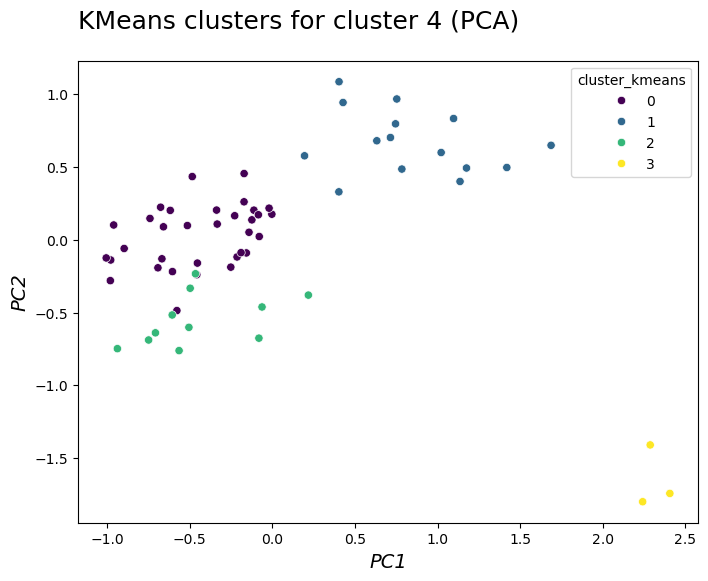

Mean centers for Cluster 5:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.007575,0.002599,0.016477,0.981114,0.023851,0.006511,0.399643,0.495590,0.979692,0.020318,...,0.218023,0.233758,0.233493,0.408073,0.325848,0.438703,0.620904,0.227137,0.259963,0.281489
Cluster 2,0.527019,0.428798,0.626581,1.000000,0.575130,0.435052,0.036085,0.106882,0.537193,0.454684,...,0.116770,0.845011,0.851598,0.509393,0.173867,0.458912,0.749237,0.108893,0.282407,0.305036
Cluster 3,0.117091,0.077713,0.197994,0.815183,0.251261,0.094472,0.181860,0.326485,0.743611,0.322219,...,0.234784,0.580929,0.610496,0.450094,0.299316,0.459420,0.740611,0.259234,0.415585,0.429445


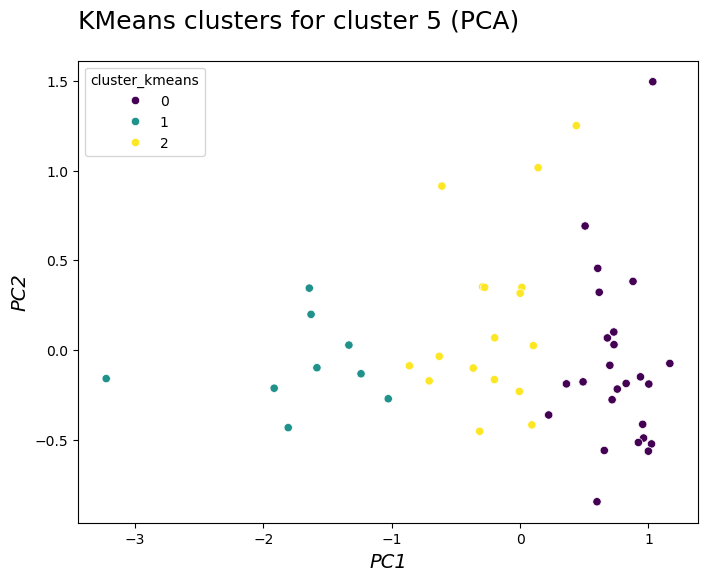

In [44]:
# Print cluster centers and project onto PCA coordinates
for cluster_idx, clusters in optimal_clusters.items():
    
    # Perform KMeans with optimal_clusters data
    kmeans = KMeans(n_clusters=clusters, random_state=rdst)
    normalized_clusters_k = normalized_clusters[cluster_idx].copy()
    normalized_clusters_k['cluster_kmeans'] = kmeans.fit_predict(features_all_clusters[cluster_idx])

    # Compute and print cluster centers
    k_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features_all_clusters[cluster_idx].columns)
    k_centers.index = [f'Cluster {i+1}' for i in range(clusters)]
    print(f"Mean centers for Cluster {cluster_idx + 1}:")
    display(k_centers)

    # Add PCA components to the dataframe
    pca_result = pca_results_all_clusters[cluster_idx]
    normalized_clusters_k['PCA1'] = pca_result['PCA1']
    normalized_clusters_k['PCA2'] = pca_result['PCA2']
    
    # Plot clusters over PC1 and PC2
    fig, ax = plt.subplots(figsize=(8, 6))
    sn.scatterplot(data=normalized_clusters_k, x='PCA1', y='PCA2', hue='cluster_kmeans', palette='viridis')
    ax.set_xlabel('PC1', size=14, fontstyle='italic')
    ax.set_ylabel('PC2', size=14, fontstyle='italic')
    ax.set_title(f'KMeans clusters for cluster {cluster_idx + 1} (PCA)', y=1.1, pad=-10, loc='left', size=18)

    plt.show()

## Hierarchical

### Silhouette

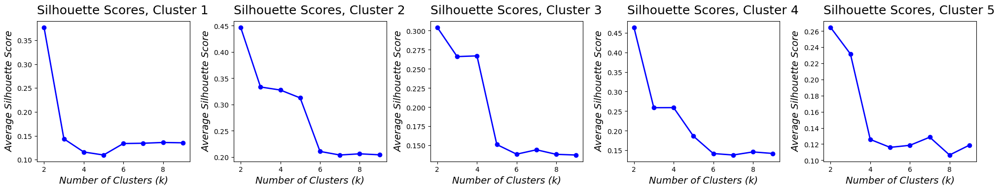

In [45]:
# Set up the figure with subplots, adjusting the number of rows and columns
fig, axes = plt.subplots(1, n_clusters, figsize=(20, 4))

for k in range(n_clusters):
    features_cluster_k = features_all_clusters[k]
    Z_k = linkage(features_cluster_k, method='complete')
    sil_scores = []
    k_values = range(2, 10)
    
    for k_val in k_values:
        labels = fcluster(Z_k, k_val, criterion='maxclust')
        score = silhouette_score(features_cluster_k, labels)
        sil_scores.append(score)
    
    ax = axes[k]
    ax.plot(k_values, sil_scores, 'bo-', linewidth=2)
    ax.set_xlabel("Number of Clusters (k)", size=14, fontstyle='italic')
    ax.set_ylabel("Average Silhouette Score", size=14, fontstyle='italic')
    ax.set_title(f'Silhouette Scores, Cluster {k+1}', y=1.1, pad=-10, loc='left', size=18)

plt.tight_layout()
plt.show()

### Gap statistics

Optimal number of clusters for cluster 1: 6
Optimal number of clusters for cluster 2: 8
Optimal number of clusters for cluster 3: 15
Optimal number of clusters for cluster 4: 11
Optimal number of clusters for cluster 5: 9


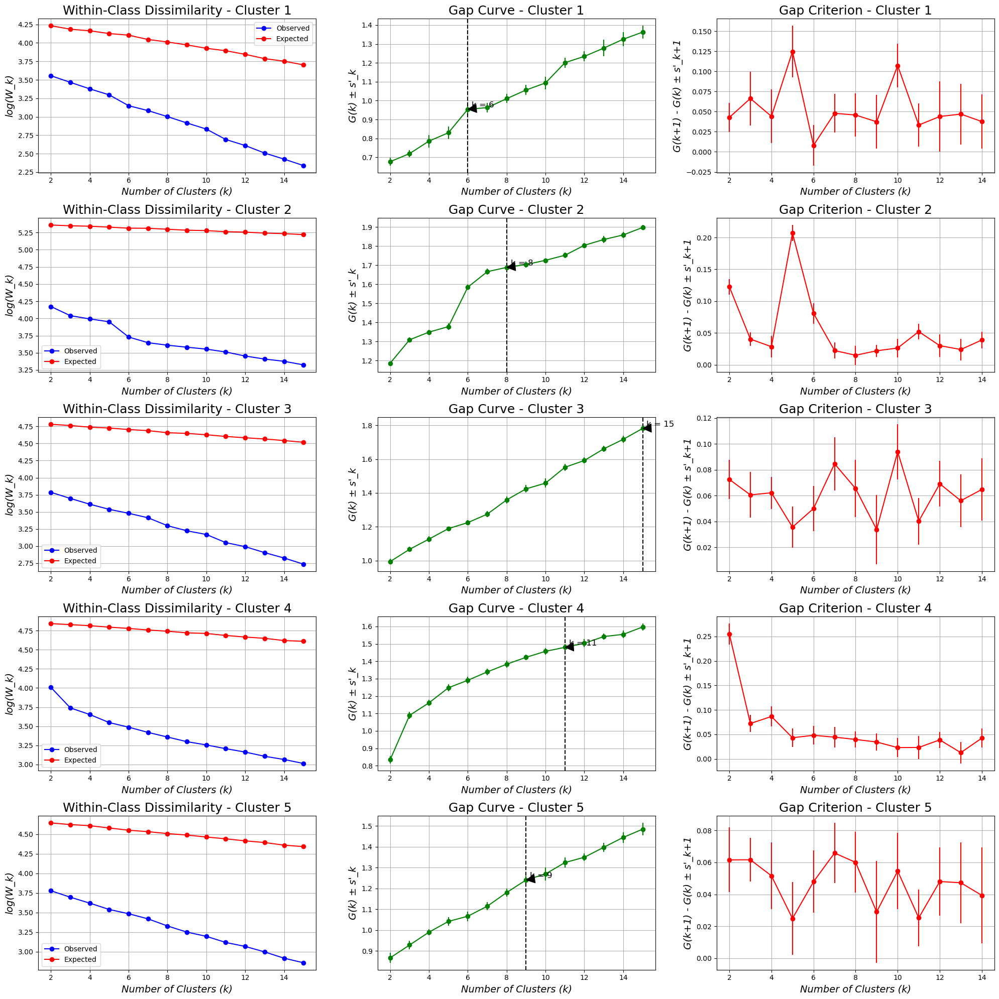

In [46]:
k_clusters = 15
optimal_clusters = {}

# Set figure with 3 cols and n clusters rows
fig, axes = plt.subplots(n_clusters, 3, figsize = (20, 4 * n_clusters))

for cluster_idx in range(n_clusters):
    features_cluster_k = features_all_clusters[cluster_idx]
    hierach_model = HierarchicalModel(method = 'complete', criterion = 'maxclust')
    
    (log_wk,
     expected_log_wk,
     gaps,
     gap_diff,
     s_k_ref,
     s_prime_k,
     k_1se) = gap_statistics(features_cluster_k, k_clusters, references = 20, random_state = rdst, model = hierach_model)
    
    optimal_clusters[cluster_idx] = k_1se
    print(f'Optimal number of clusters for cluster {cluster_idx+1}: {k_1se}')

    # Plot 1: Within-Class Dissimilarity
    axes[cluster_idx, 0].plot(range(2, k_clusters + 1), log_wk, marker='o', color='b', label='Observed')
    axes[cluster_idx, 0].plot(range(2, k_clusters + 1), expected_log_wk, marker='o', color='r', label='Expected')
    axes[cluster_idx, 0].set_title(f'Within-Class Dissimilarity - Cluster {cluster_idx + 1}', size=18)
    axes[cluster_idx, 0].set_xlabel('Number of Clusters (k)', size=14, fontstyle='italic')
    axes[cluster_idx, 0].set_ylabel('log(W_k)', size=14, fontstyle='italic')
    axes[cluster_idx, 0].grid(True)
    axes[cluster_idx, 0].legend()

    # Plot 2: Gap Curve
    axes[cluster_idx, 1].errorbar(range(2, k_clusters + 1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
    axes[cluster_idx, 1].axvline(x=k_1se, color='black', linestyle='--', label=f'Optimal k = {k_1se}')
    axes[cluster_idx, 1].annotate(f'k = {k_1se}', 
                 xy=(k_1se, gaps[k_1se - 2]), 
                 xytext=(k_1se + 0.2, gaps[k_1se - 2] + 0.01), 
                 arrowprops=dict(facecolor='black', shrink=0.05),
                 fontsize=12)
    axes[cluster_idx, 1].set_title(f'Gap Curve - Cluster {cluster_idx + 1}', size=18)
    axes[cluster_idx, 1].set_xlabel('Number of Clusters (k)', size=14, fontstyle='italic')
    axes[cluster_idx, 1].set_ylabel('G(k) ± s\'_k', size=14, fontstyle='italic')
    axes[cluster_idx, 1].grid(True)

    # Plot 3: Gap Criterion
    axes[cluster_idx, 2].errorbar(range(2, k_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
    axes[cluster_idx, 2].set_title(f'Gap Criterion - Cluster {cluster_idx + 1}', size=18)
    axes[cluster_idx, 2].set_xlabel('Number of Clusters (k)', size=14, fontstyle='italic')
    axes[cluster_idx, 2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size=14, fontstyle='italic')
    axes[cluster_idx, 2].grid(True)

plt.tight_layout()
plt.show()

### Clustering - k = 2

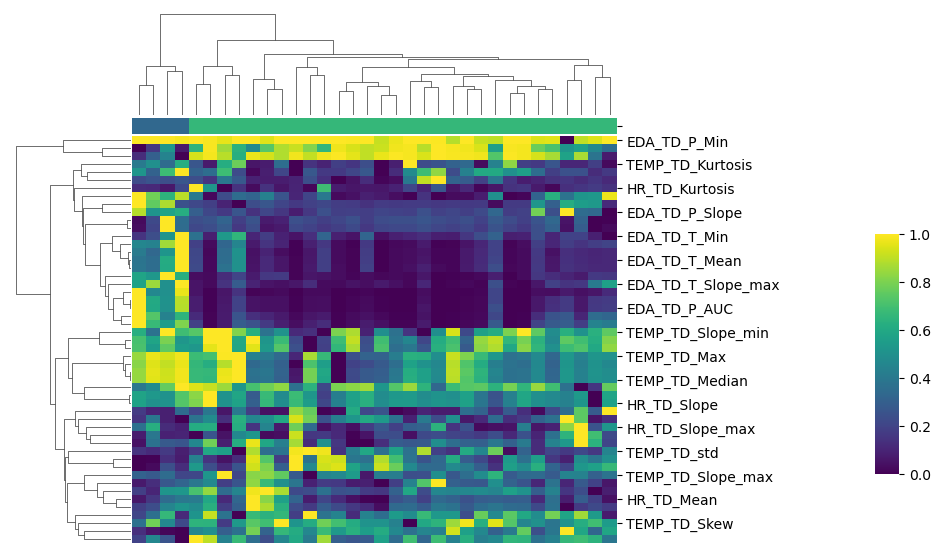

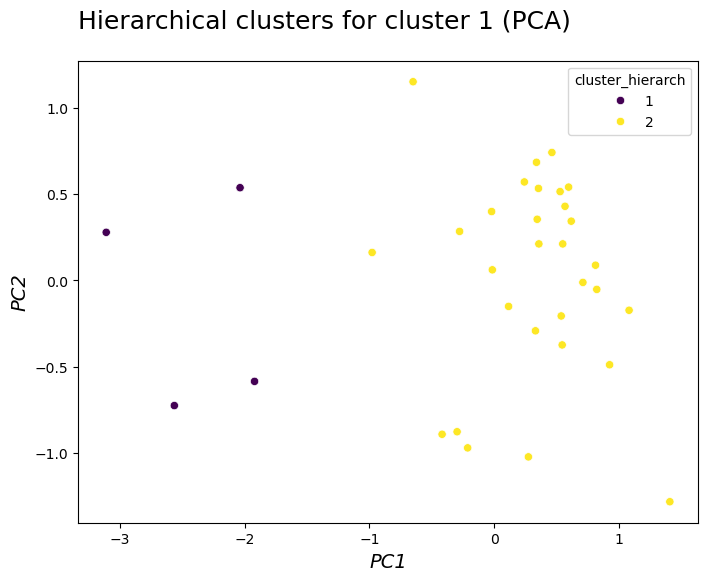

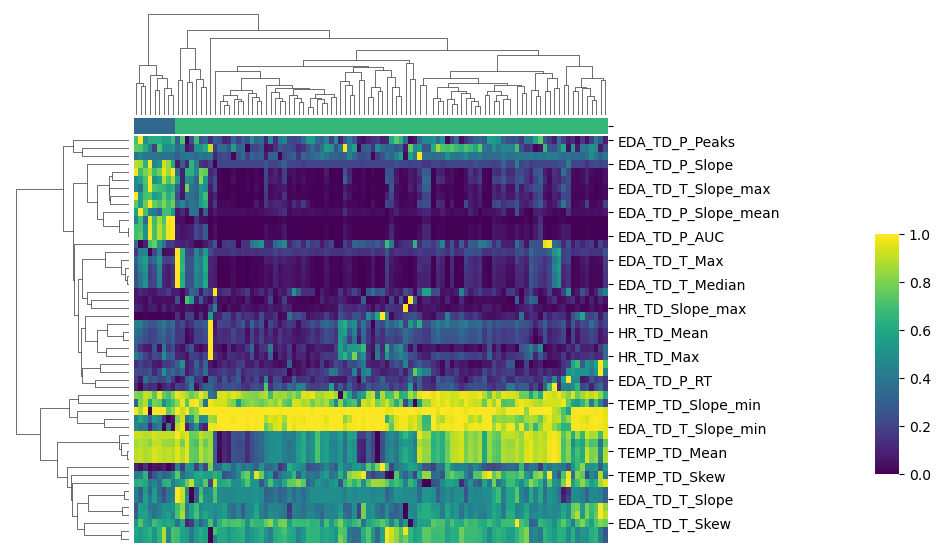

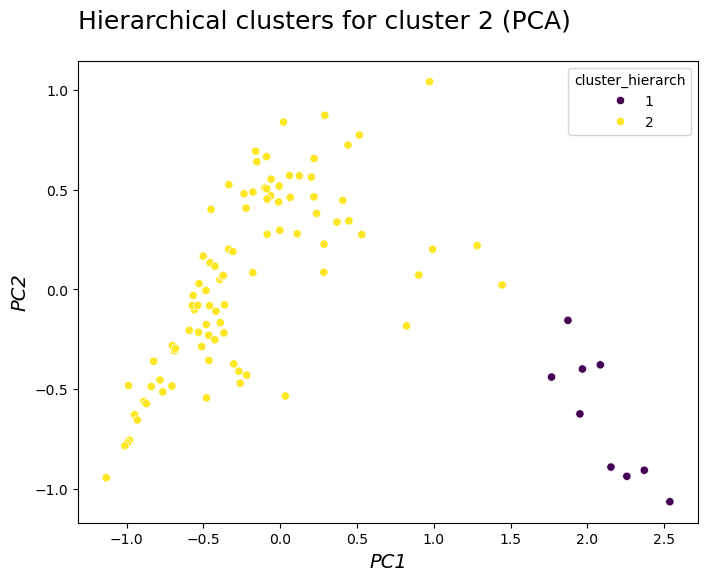

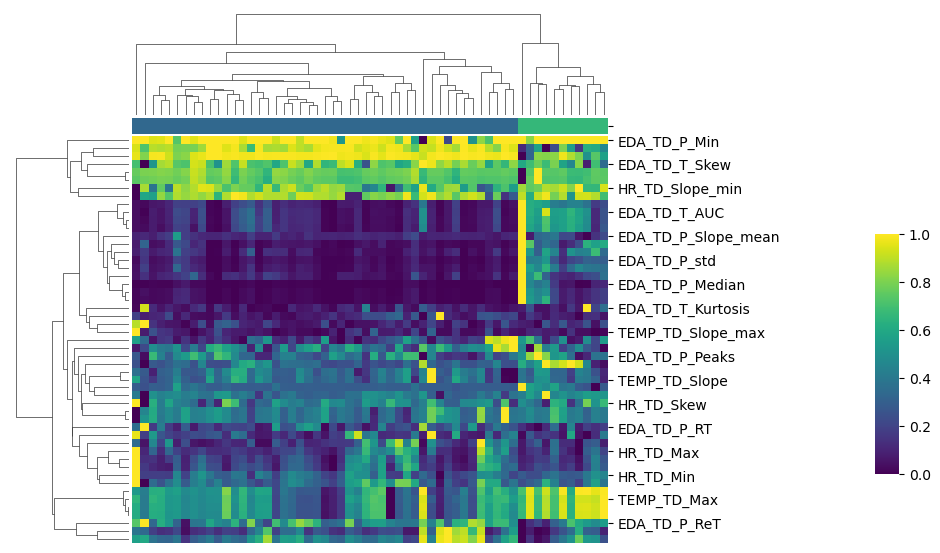

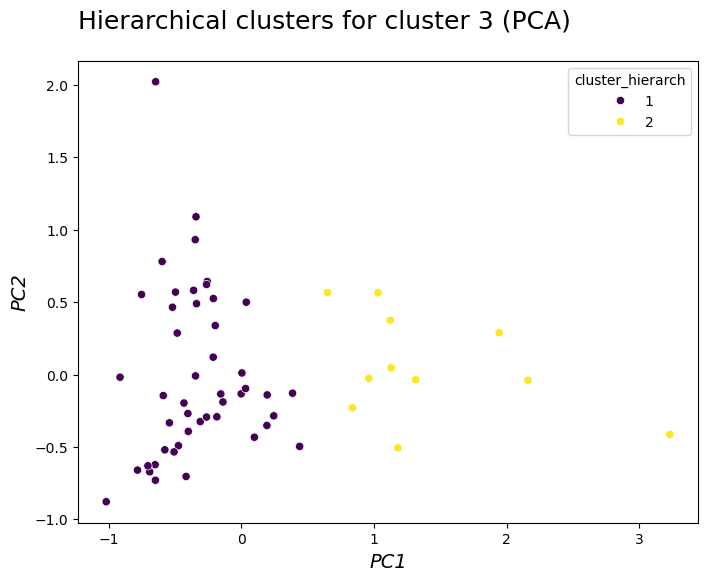

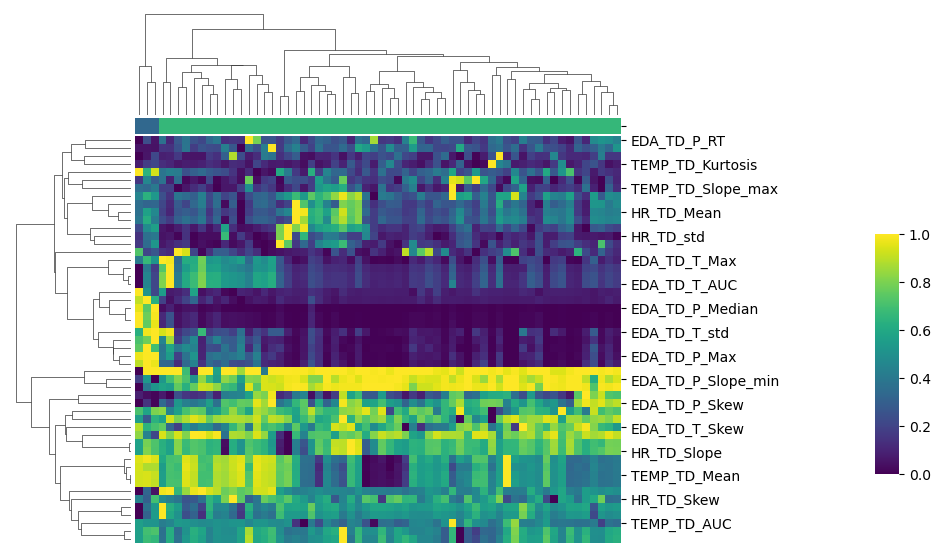

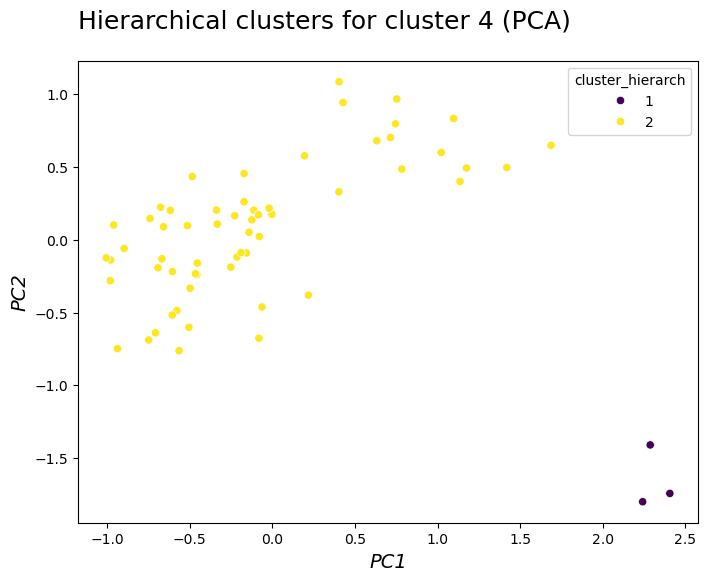

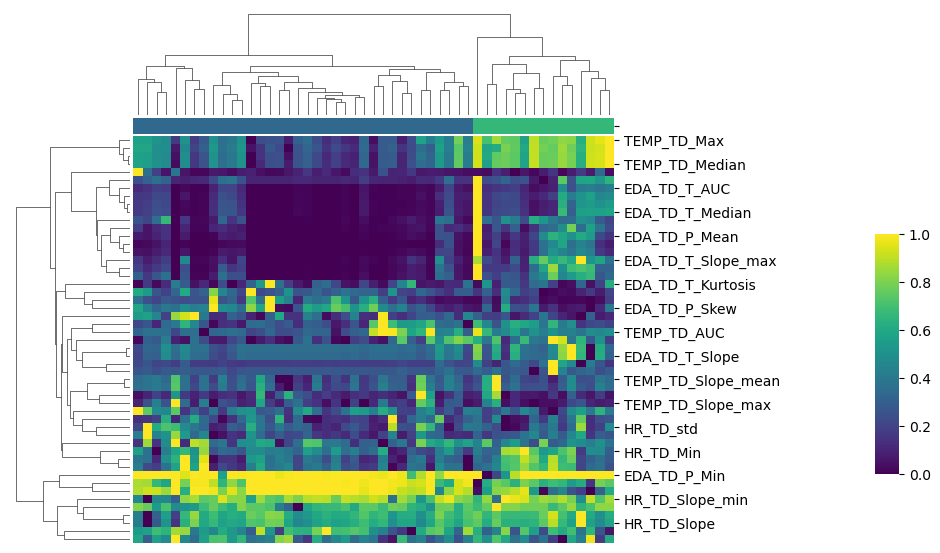

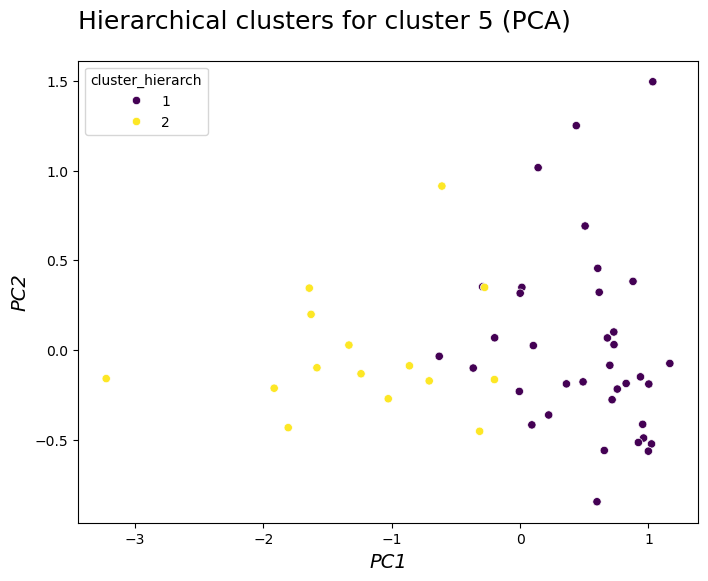

In [47]:
# Print heatmaps project onto PCA coordinates with labels
for cluster_idx, clusters in optimal_clusters.items():

    # Perform hierarch clustering with optimal_clusters data
    features_cluster_k = features_all_clusters[cluster_idx]
    Z_k = linkage(features_cluster_k, method='complete')
    labels = fcluster(Z_k, 2, criterion = 'maxclust')
    normalized_clusters_k = normalized_clusters[cluster_idx].copy()
    normalized_clusters_k['cluster_hierarch'] = labels

    # Create a color array based on the labels (one color per cluster)
    label_series = pd.Series(labels, index = features_cluster_k.index)
    palette = sn.color_palette('viridis', 2)
    col_colors = label_series.map(lambda x: palette[x - 1])

    # Plot heatmap with dendrograms
    ax_heatmap = sn.clustermap(features_cluster_k.T, cmap = 'viridis',
              col_linkage = Z_k, col_colors = col_colors, row_cluster = True,
              figsize = (8, 6), cbar_pos = (1.1, .2, .03, .4))
    ax_heatmap.ax_heatmap.set_xticks([])

    # Add PCA components to the dataframe
    pca_result = pca_results_all_clusters[cluster_idx]
    normalized_clusters_k['PCA1'] = pca_result['PCA1']
    normalized_clusters_k['PCA2'] = pca_result['PCA2']
    
    # Plot clusters over PC1 and PC2
    fig, ax = plt.subplots(figsize=(8, 6))
    sn.scatterplot(data = normalized_clusters_k, x='PCA1', y='PCA2', hue='cluster_hierarch', palette='viridis')
    ax.set_xlabel('PC1', size=14, fontstyle='italic')
    ax.set_ylabel('PC2', size=14, fontstyle='italic')
    ax.set_title(f'Hierarchical clusters for cluster {cluster_idx + 1} (PCA)', y=1.1, pad=-10, loc='left', size=18)

    plt.show()

### Clustering - optimal k

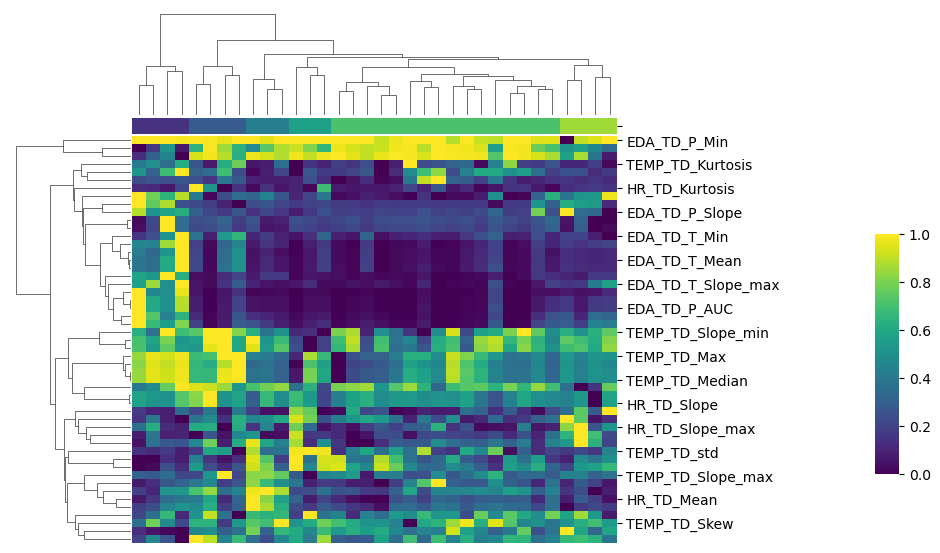

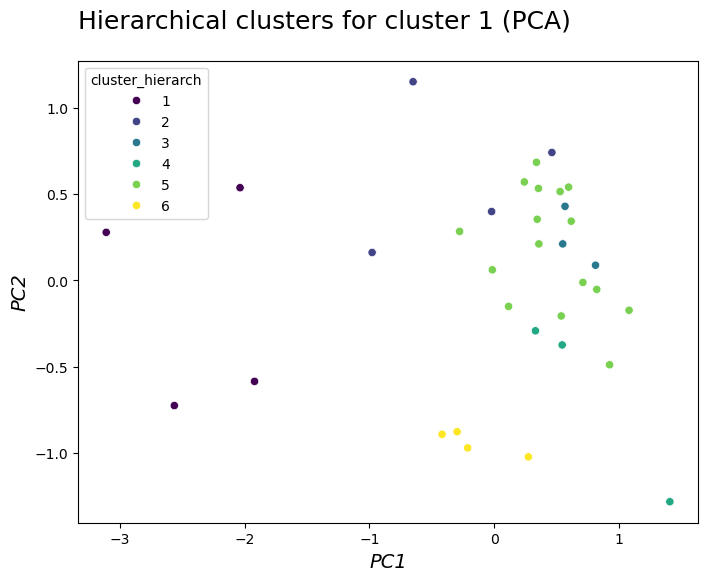

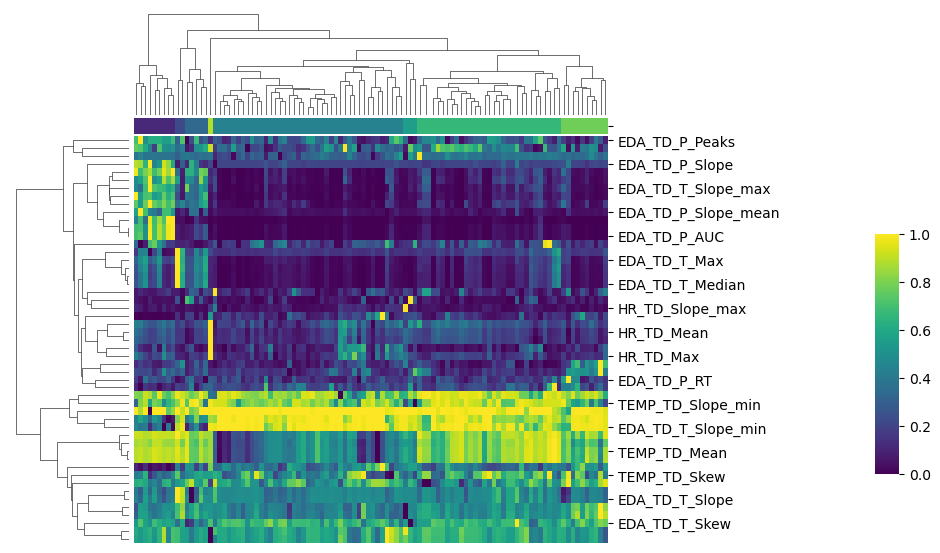

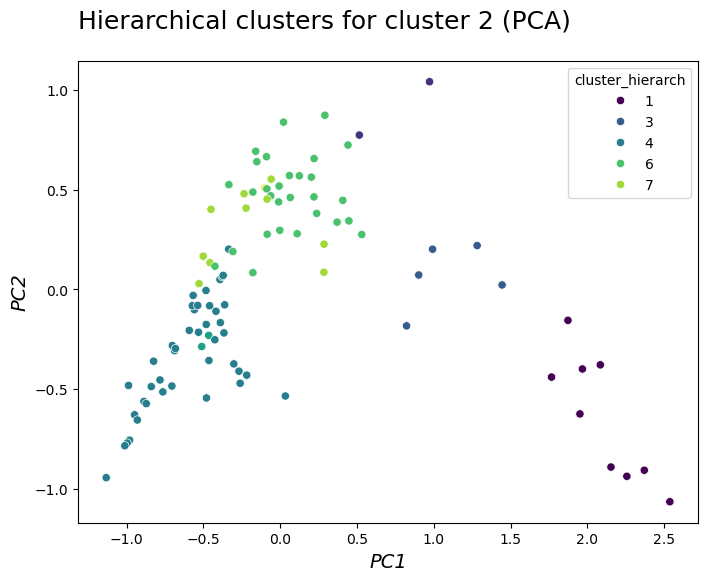

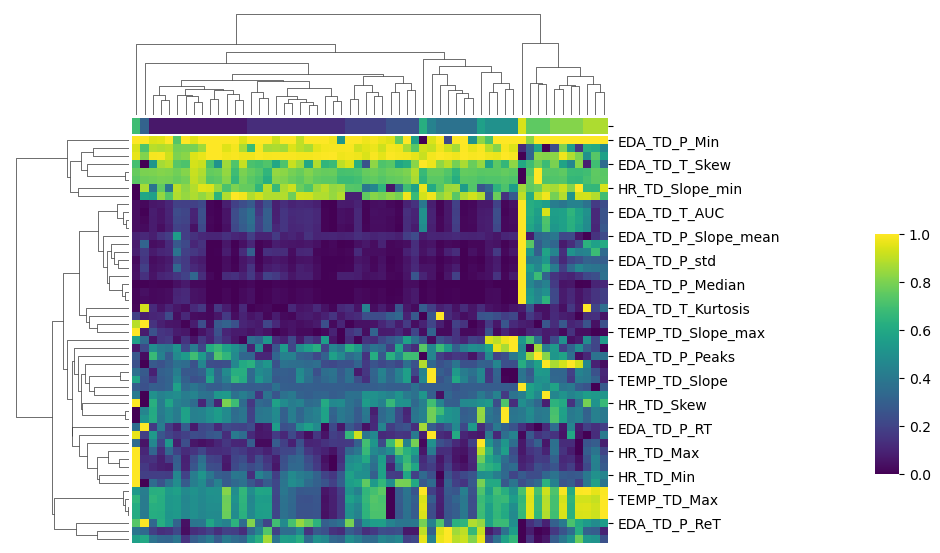

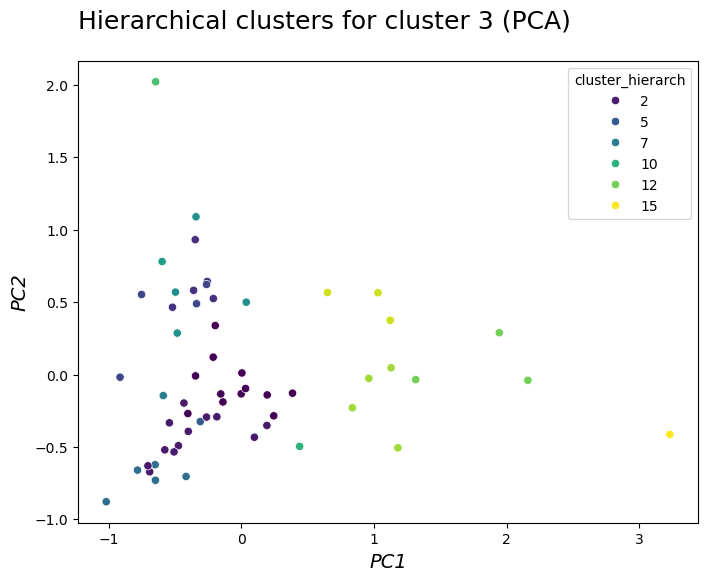

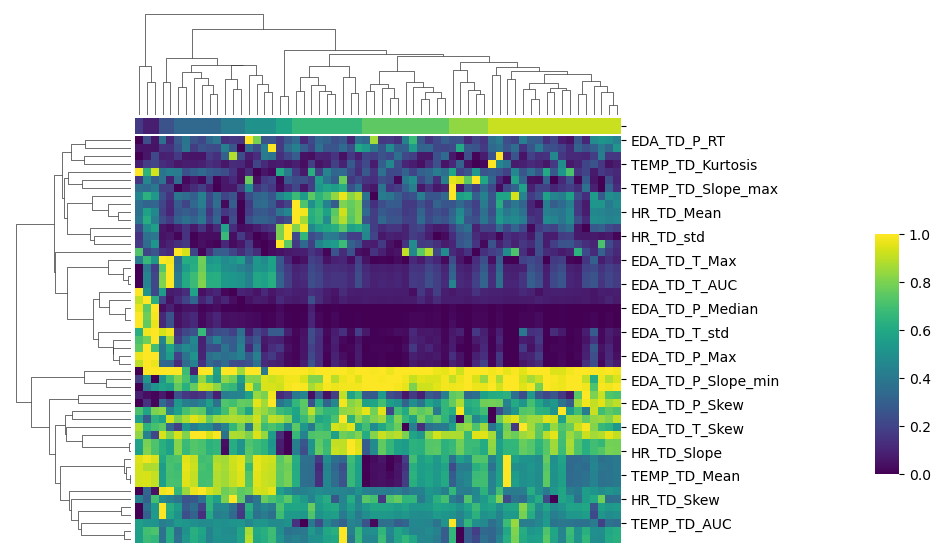

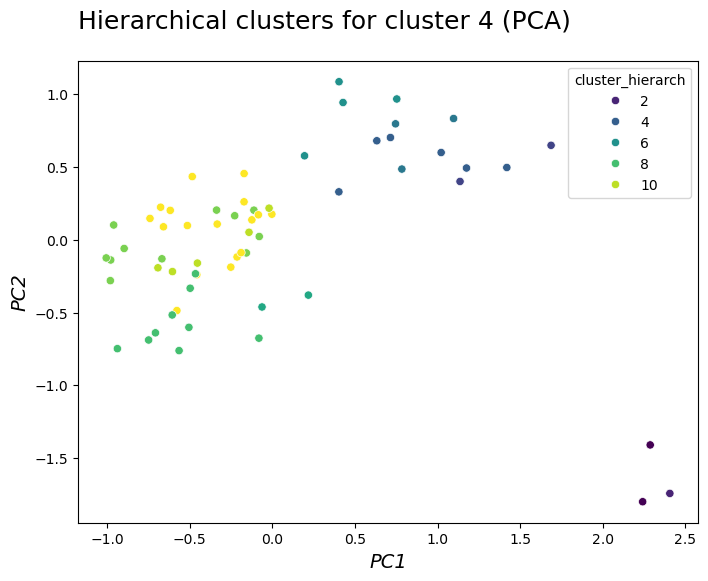

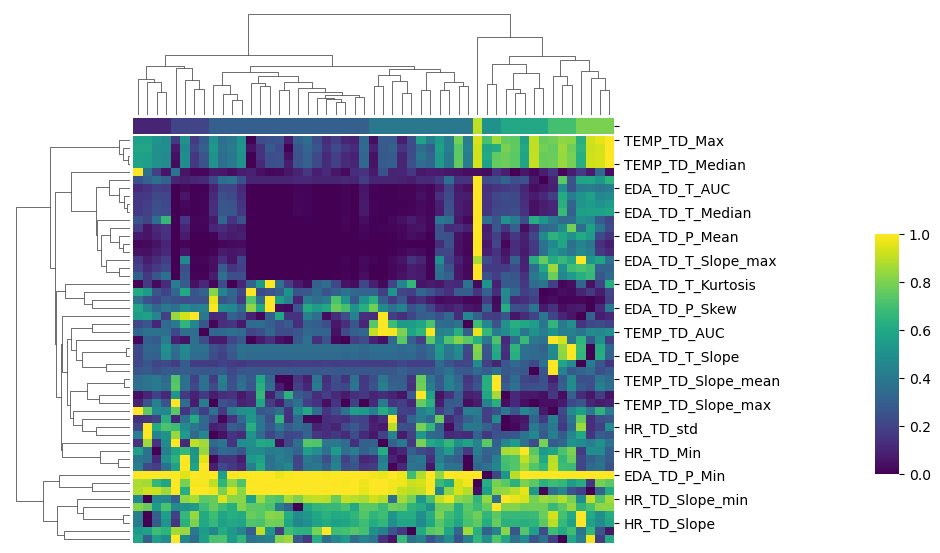

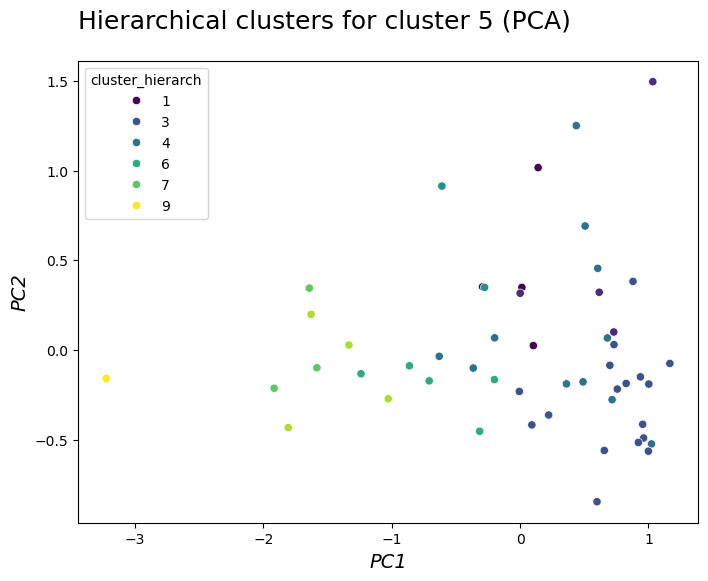

In [48]:
# Print heatmaps project onto PCA coordinates with labels
for cluster_idx, clusters in optimal_clusters.items():

    # Perform hierarch clustering with optimal_clusters data
    features_cluster_k = features_all_clusters[cluster_idx]
    Z_k = linkage(features_cluster_k, method='complete')
    labels = fcluster(Z_k, clusters, criterion = 'maxclust')
    normalized_clusters_k = normalized_clusters[cluster_idx].copy()
    normalized_clusters_k['cluster_hierarch'] = labels

    # Create a color array based on the labels (one color per cluster)
    label_series = pd.Series(labels, index=features_cluster_k.index)
    palette = sn.color_palette('viridis', clusters)
    col_colors = label_series.map(lambda x: palette[x - 1])


    # Plot heatmap with dendrograms
    ax_heatmap = sn.clustermap(features_cluster_k.T, cmap = 'viridis',
              col_linkage = Z_k, col_colors = col_colors, row_cluster = True,
              figsize = (8, 6), cbar_pos = (1.1, .2, .03, .4))
    ax_heatmap.ax_heatmap.set_xticks([])

    # Add PCA components to the dataframe
    pca_result = pca_results_all_clusters[cluster_idx]
    normalized_clusters_k['PCA1'] = pca_result['PCA1']
    normalized_clusters_k['PCA2'] = pca_result['PCA2']
    
    # Plot clusters over PC1 and PC2
    fig, ax = plt.subplots(figsize=(8, 6))
    sn.scatterplot(data = normalized_clusters_k, x='PCA1', y='PCA2', hue='cluster_hierarch', palette='viridis')
    ax.set_xlabel('PC1', size=14, fontstyle='italic')
    ax.set_ylabel('PC2', size=14, fontstyle='italic')
    ax.set_title(f'Hierarchical clusters for cluster {cluster_idx + 1} (PCA)', y=1.1, pad=-10, loc='left', size=18)

    plt.show()

# Physiological responses - 2 clusters

The physiological responses are examined for each of the two clusters identified using Kmeans.

## Data

### Separate clusters

In [49]:
phys_data_indexed = pd.concat([idx_phys_data_cleaned, phys_data_cleaned], axis=1)
idx_final = final_quest_data.columns[0]
idx_phys = phys_data_indexed.columns[0]
merged = phys_data_indexed.merge(final_quest_data[[idx_final, 'cluster_2_kmeans']], left_on=idx_phys, right_on=idx_final)

# Cluster 1
cluster1_indexed = merged[merged['cluster_2_kmeans'] == 1]
cluster1_phys_data = cluster1_indexed[feature_columns]
print(f'Samples in 1st cluster: {cluster1_phys_data.shape[0]}')

# cluster 2
cluster2_indexed = merged[merged['cluster_2_kmeans'] == 2]
cluster2_phys_data = cluster2_indexed[feature_columns]
print(f'Samples in 2nd cluster: {cluster2_phys_data.shape[0]}')

Samples in 1st cluster: 145
Samples in 2nd cluster: 162


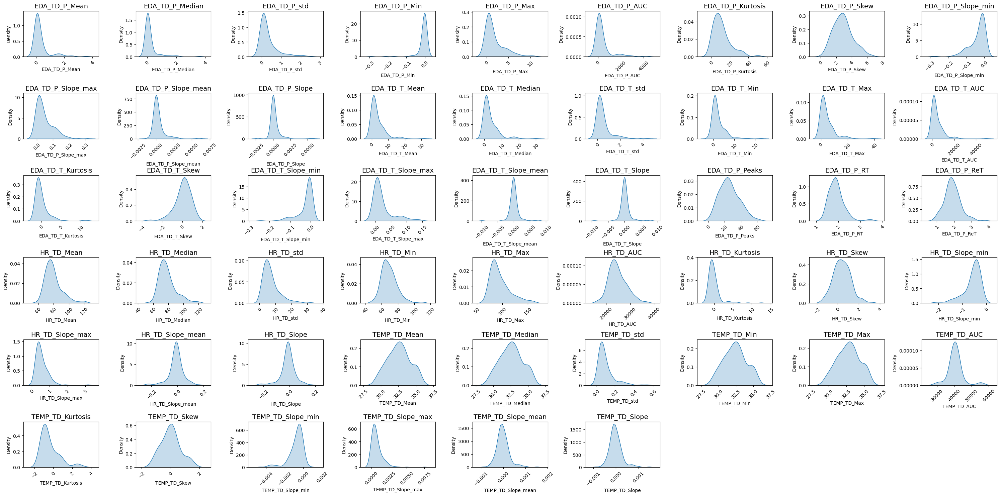

In [50]:
# Plot cluster 1 densities
rows, cols = 6, 9
fig, axes = plt.subplots(rows, cols, figsize=(30, 15), sharey=False)
axes = axes.flatten()
fig.subplots_adjust(wspace=0.5)

for i in range(feat):
    sn.kdeplot(cluster1_phys_data.iloc[:, i], ax=axes[i], fill=True)
    axes[i].set_title(cluster1_phys_data.columns[i], fontsize=14)
    axes[i].tick_params(axis='x', labelrotation=45)

# Tremove unused subplots
for j in range(feat, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

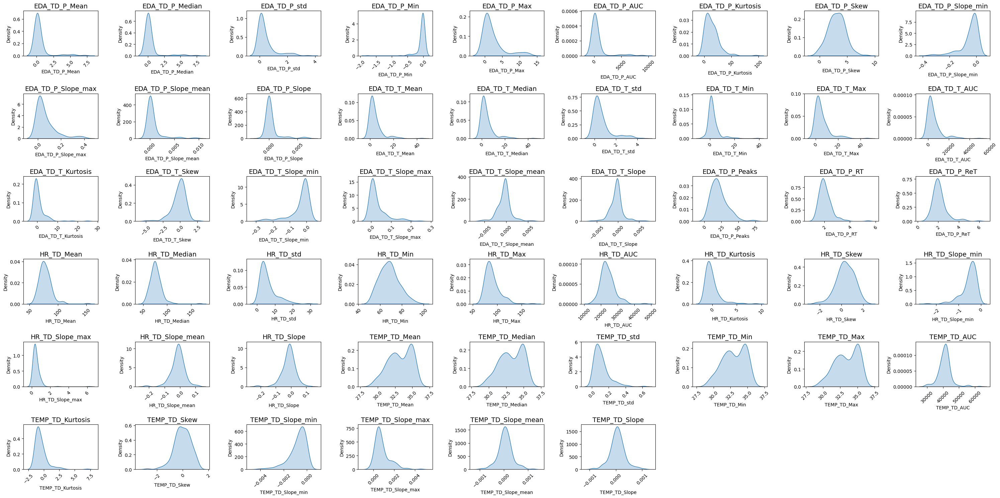

In [51]:
# Plot cluster 2 densities
rows, cols = 6, 9
fig, axes = plt.subplots(rows, cols, figsize=(30, 15), sharey=False)
axes = axes.flatten()
fig.subplots_adjust(wspace=0.5)

for i in range(feat):
    sn.kdeplot(cluster2_phys_data.iloc[:, i], ax=axes[i], fill=True)
    axes[i].set_title(cluster2_phys_data.columns[i], fontsize=14)
    axes[i].tick_params(axis='x', labelrotation=45)

# Tremove unused subplots
for j in range(feat, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

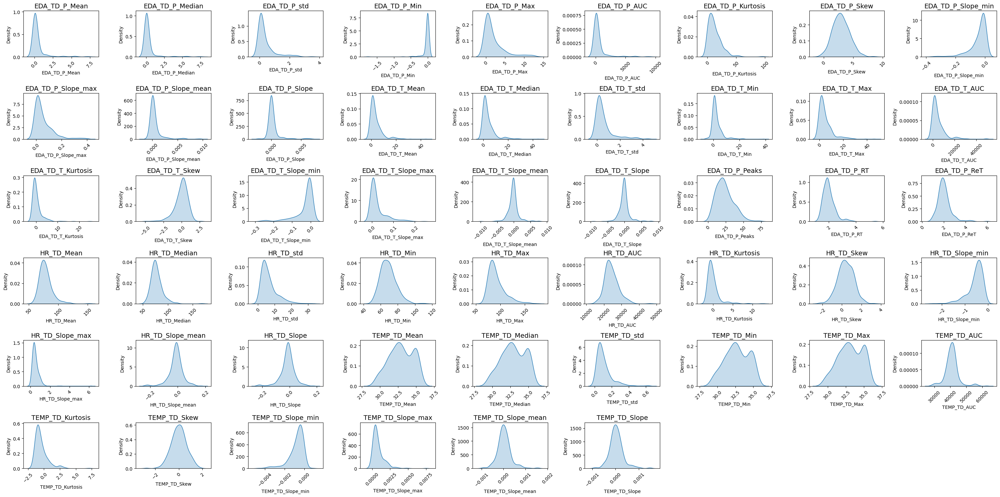

In [52]:
# Plot combined densities
rows, cols = 6, 9
fig, axes = plt.subplots(rows, cols, figsize=(30, 15), sharey=False)
axes = axes.flatten()
fig.subplots_adjust(wspace=0.5)

for i in range(feat):
    sn.kdeplot(phys_data_cleaned.iloc[:, i], ax=axes[i], fill=True)
    axes[i].set_title(phys_data_cleaned.columns[i], fontsize=14)
    axes[i].tick_params(axis='x', labelrotation=45)

# Tremove unused subplots
for j in range(feat, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [53]:
# Normalize to range from 0 to 1
normalized_cluster1_phys_data = pd.DataFrame(
    scaler.fit_transform(cluster1_phys_data),
    columns=cluster1_phys_data.columns,
    index=cluster1_phys_data.index)

normalized_cluster2_phys_data = pd.DataFrame(
    scaler.fit_transform(cluster2_phys_data),
    columns=cluster2_phys_data.columns,
    index=cluster2_phys_data.index)


In [54]:
# Define feature data

features_cluster1 = normalized_cluster1_phys_data[feature_columns]
features_cluster2 = normalized_cluster2_phys_data[feature_columns]

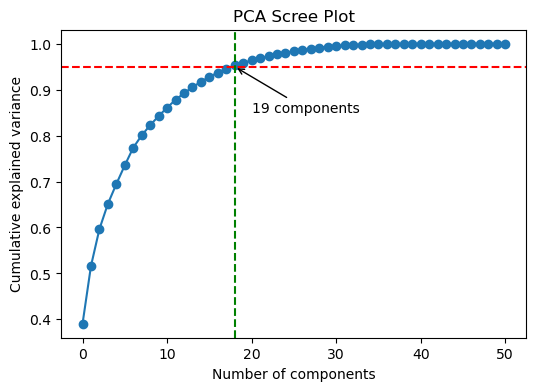

In [55]:
# PCA for visualizing clusters
pca = PCA(n_components=2)
pca_result = pca.fit_transform(features_all)
normalized_phys_data['PCA1'] = pca_result[:, 0]
normalized_phys_data['PCA2'] = pca_result[:, 1]

pca_result_cluster1 = pca.fit_transform(features_cluster1)
normalized_cluster1_phys_data['PCA1'] = pca_result_cluster1[:, 0]
normalized_cluster1_phys_data['PCA2'] = pca_result_cluster1[:, 1]

pca_result_cluster2 = pca.fit_transform(features_cluster2)
normalized_cluster2_phys_data['PCA1'] = pca_result_cluster2[:, 0]
normalized_cluster2_phys_data['PCA2'] = pca_result_cluster2[:, 1]

# Scree plot of overall data
pca2 = PCA(n_components=feat)
pca2_results = pca2.fit_transform(features_all)

cum_var = np.cumsum(pca2.explained_variance_ratio_)
n_95 = np.argmax(cum_var >= 0.95) + 1

plt.figure(figsize=(6, 4))
plt.plot(cum_var, marker='o')

plt.axhline(y=0.95, color='r', linestyle='--', label='95% variance')
plt.axvline(x=n_95 - 1, color='g', linestyle='--', label=f'{n_95} components')
plt.annotate(f"{n_95} components", xy=(n_95 - 1, 0.95), xytext=(n_95 + 1, 0.85), arrowprops=dict(arrowstyle='->', color='black'), fontsize=10)

plt.xlabel("Number of components")
plt.ylabel("Cumulative explained variance")
plt.title("PCA Scree Plot")
plt.show()

## Similarity

### Similarity

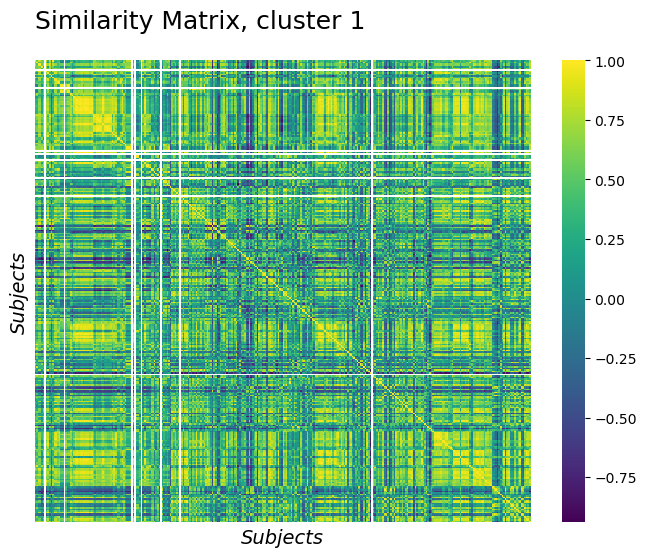

In [56]:
# Cluster 1
similarity_matrix1 = features_cluster1.T.corr()

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(similarity_matrix, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Similarity Matrix, cluster 1', y=1.1, pad=-10, loc='left', size=18)

plt.show()

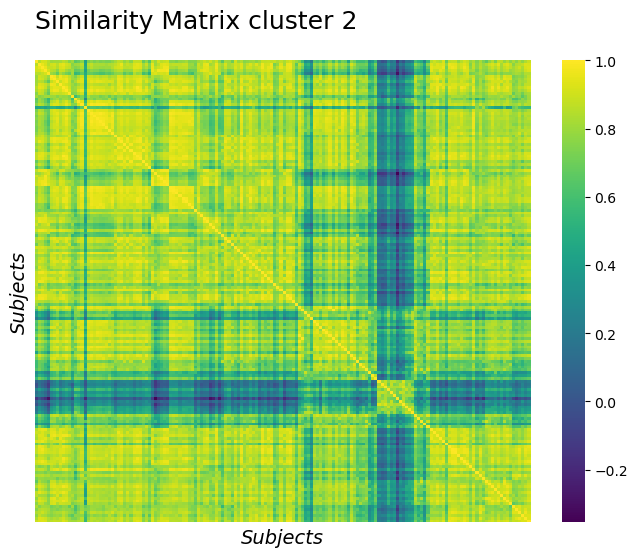

In [57]:
# Cluster 2
similarity_matrix2 = features_cluster2.T.corr()

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(similarity_matrix2, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Similarity Matrix cluster 2', y=1.1, pad=-10, loc='left', size=18)

plt.show()

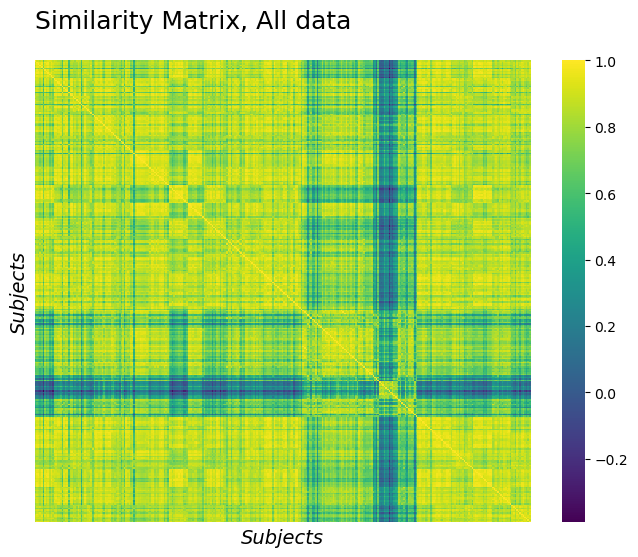

In [58]:
# All data
similarity_matrixAll = features_all.T.corr()

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(similarity_matrixAll, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Similarity Matrix, All data', y=1.1, pad=-10, loc='left', size=18)

plt.show()

### Dissimilarity

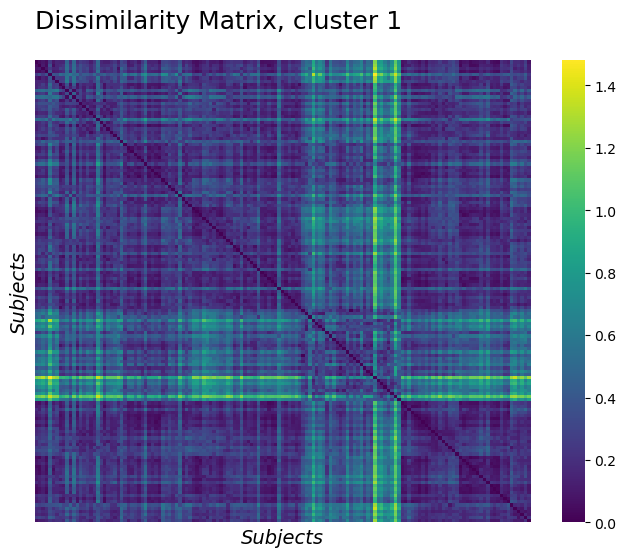

In [59]:
# Cluster 1
dissimilarity_matrix1 = 1 - similarity_matrix1

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(dissimilarity_matrix1, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Dissimilarity Matrix, cluster 1', y=1.1, pad=-10, loc='left', size=18)

plt.show()

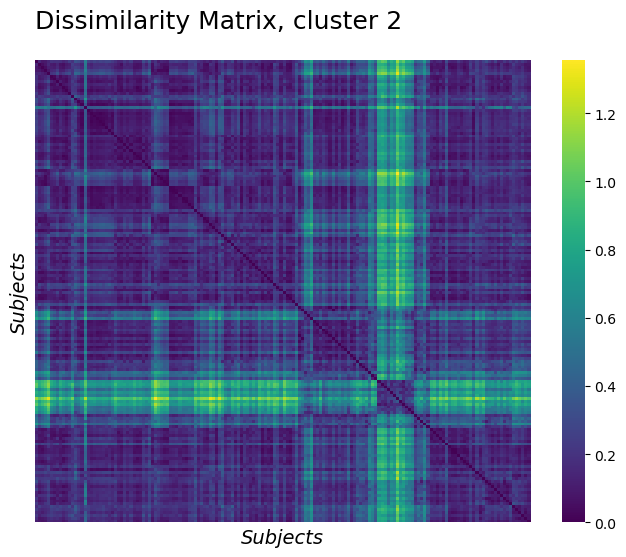

In [60]:
# Cluster 2
dissimilarity_matrix2 = 1 - similarity_matrix2

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(dissimilarity_matrix2, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Dissimilarity Matrix, cluster 2', y=1.1, pad=-10, loc='left', size=18)

plt.show()

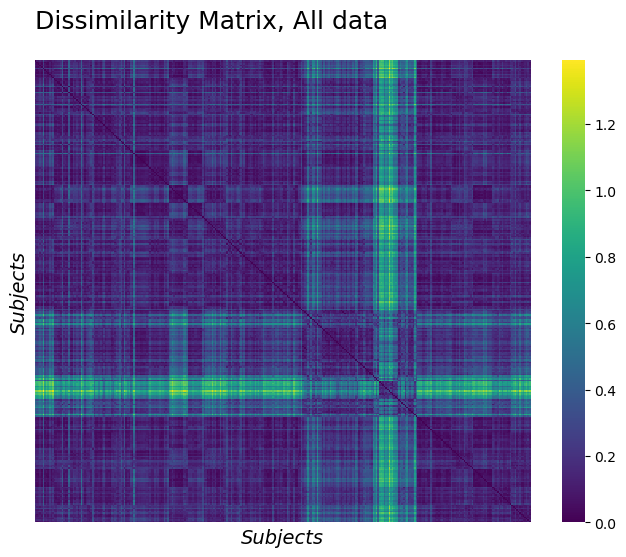

In [61]:
# Cluster 2
dissimilarity_matrixAll = 1 - similarity_matrixAll

# Heatmap
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.heatmap(dissimilarity_matrixAll, cmap='viridis', annot=False)
ax.set_ylabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xlabel("Subjects", size = 14, fontstyle = 'italic')
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('Dissimilarity Matrix, All data', y=1.1, pad=-10, loc='left', size=18)

plt.show()

## Kmeans

### Silhouette

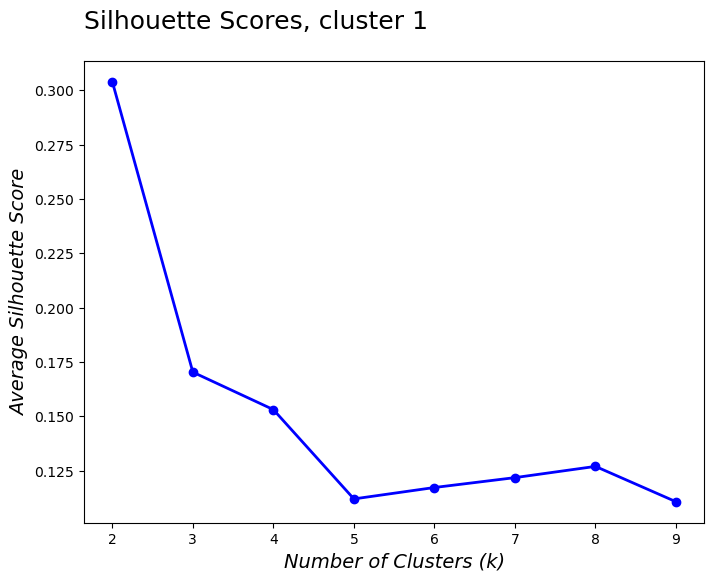

In [62]:
# Cluster 1
sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    model = KMeans(n_clusters=k, random_state=rdst)
    labels = model.fit_predict(features_cluster1)
    score = silhouette_score(features_cluster1, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores, cluster 1', y=1.1, pad=-10, loc='left', size=18)

plt.show()

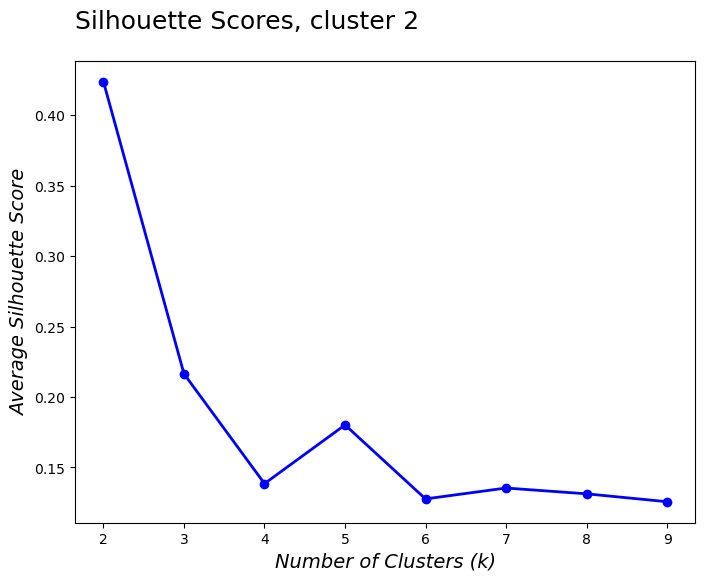

In [63]:
# Cluster 2
sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    model = KMeans(n_clusters=k, random_state=rdst)
    labels = model.fit_predict(features_cluster2)
    score = silhouette_score(features_cluster2, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores, cluster 2', y=1.1, pad=-10, loc='left', size=18)

plt.show()

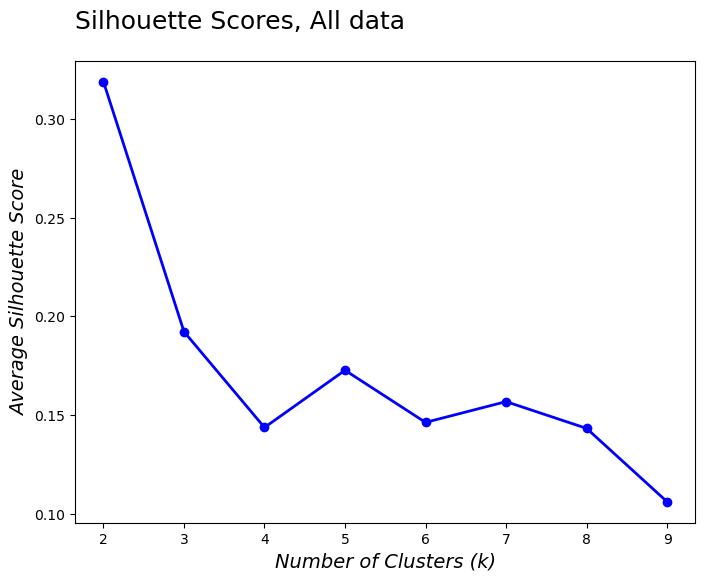

In [64]:
# Alle data
sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    model = KMeans(n_clusters=k, random_state=rdst)
    labels = model.fit_predict(features_all)
    score = silhouette_score(features_all, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores, All data', y=1.1, pad=-10, loc='left', size=18)

plt.show()

### Gap Statistics

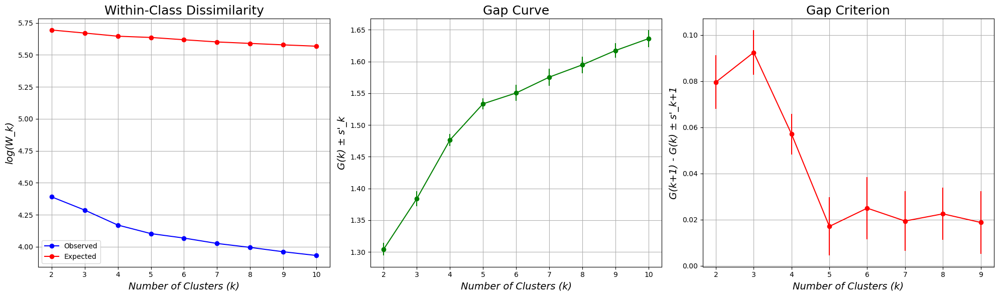

In [66]:
# Cluster 1
n_clusters = 10

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features_cluster1, n_clusters, references = 20, random_state = rdst, model = KMeans())

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

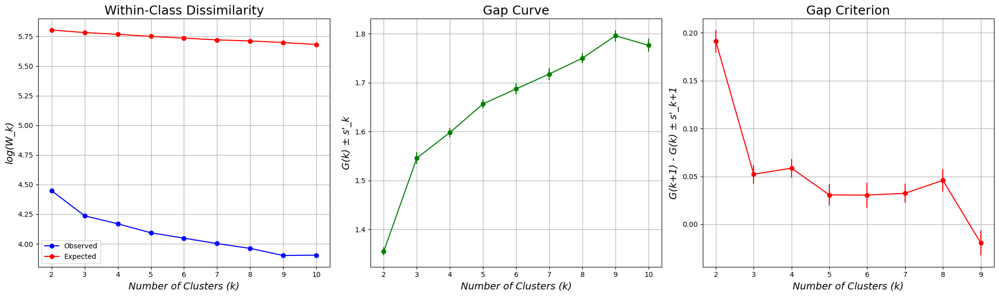

In [67]:
# Cluster 2
n_clusters = 10

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features_cluster2, n_clusters, references = 20, random_state = rdst, model = KMeans())

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

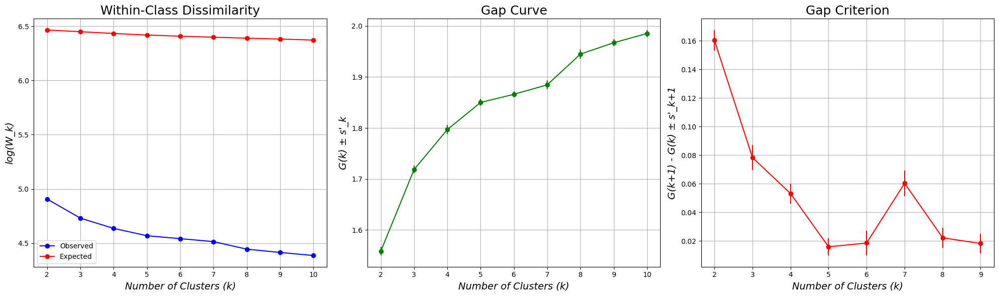

In [68]:
# All data
n_clusters = 10

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features_all, n_clusters, references = 20, random_state = rdst, model = KMeans())

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

### Clustering

In [69]:
# Print table of cluster1 mean center
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=rdst)
normalized_cluster1_phys_data['cluster_kmeans'] = kmeans.fit_predict(features_cluster1)
cluster1_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features_cluster1.columns)
cluster1_centers.index = [f'Cluster {i+1}' for i in range(n_clusters)]
print(f'Cluster 1:')
display(cluster1_centers)

# Print table of cluster2 mean center
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=rdst)
normalized_cluster2_phys_data['cluster_kmeans'] = kmeans.fit_predict(features_cluster2)
cluster2_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features_cluster2.columns)
cluster2_centers.index = [f'Cluster {i+1}' for i in range(n_clusters)]
print(f'Cluster 2:')
display(cluster2_centers)

# Print table of all data mean center
n_clusters = 2
kmeans = KMeans(n_clusters=n_clusters, random_state=rdst)
normalized_all_phys_data = normalized_phys_data.copy()
normalized_all_phys_data['cluster_kmeans'] = kmeans.fit_predict(features_all)
all_centers = pd.DataFrame(kmeans.cluster_centers_, columns=features_all.columns)
all_centers.index = [f'Cluster {i+1}' for i in range(n_clusters)]
print(f'All data:')
display(all_centers)

Cluster 1:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.024074,0.010598,0.051981,0.963877,0.075839,0.024814,0.267438,0.457737,0.923894,0.093144,...,0.173793,0.416401,0.442399,0.39913,0.257595,0.461725,0.680341,0.117805,0.356776,0.365106
Cluster 2,0.321037,0.228094,0.430441,0.966067,0.480955,0.334957,0.100843,0.244163,0.638846,0.407445,...,0.113475,0.837939,0.854158,0.50929,0.267887,0.374148,0.773709,0.074896,0.388507,0.398041


Cluster 2:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.017793,0.007347,0.056699,0.981771,0.095022,0.017706,0.168386,0.433401,0.917421,0.096059,...,0.166405,0.553137,0.579186,0.342916,0.127083,0.706260,0.794039,0.237098,0.465494,0.477806
Cluster 2,0.465498,0.405901,0.556465,0.877226,0.758895,0.455828,0.043042,0.191388,0.419794,0.656642,...,0.161652,0.860815,0.900799,0.382287,0.123577,0.677983,0.709097,0.264289,0.495511,0.510659


All data:


,EDA_TD_P_Mean,EDA_TD_P_Median,EDA_TD_P_std,EDA_TD_P_Min,EDA_TD_P_Max,EDA_TD_P_AUC,EDA_TD_P_Kurtosis,EDA_TD_P_Skew,EDA_TD_P_Slope_min,EDA_TD_P_Slope_max,...,TEMP_TD_std,TEMP_TD_Min,TEMP_TD_Max,TEMP_TD_AUC,TEMP_TD_Kurtosis,TEMP_TD_Skew,TEMP_TD_Slope_min,TEMP_TD_Slope_max,TEMP_TD_Slope_mean,TEMP_TD_Slope
Cluster 1,0.012498,0.005302,0.039123,0.992445,0.068492,0.012530,0.161244,0.425824,0.937826,0.073612,...,0.163974,0.463471,0.491672,0.350241,0.142981,0.604051,0.692437,0.156137,0.388127,0.385131
Cluster 2,0.221635,0.174184,0.342905,0.939999,0.473173,0.220105,0.062871,0.268728,0.647627,0.392934,...,0.113444,0.853447,0.872806,0.430351,0.135989,0.591533,0.729520,0.134836,0.408644,0.408137


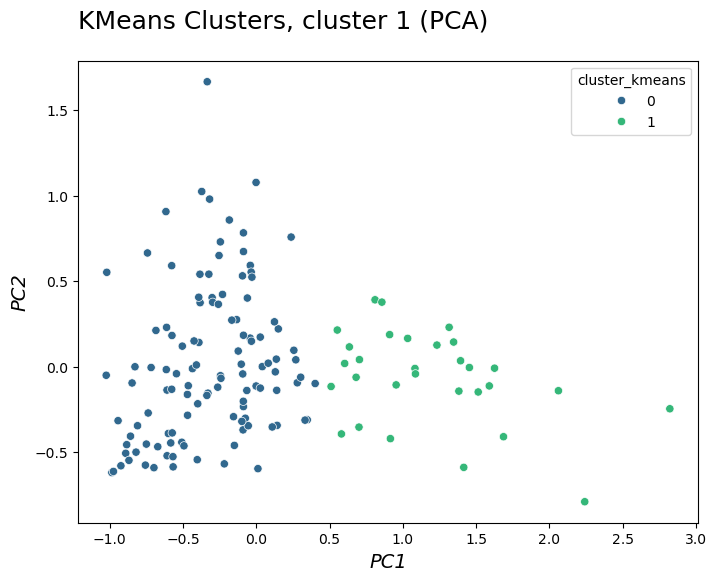

In [70]:
# Plot cluster 1 clusters over principal components
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_cluster1_phys_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_kmeans', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters, cluster 1 (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

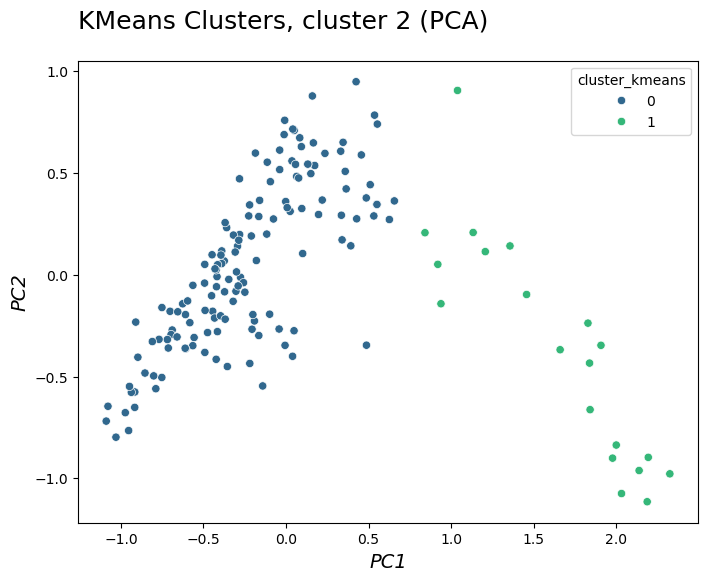

In [71]:
# Plot cluster 2 clusters over principal components
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_cluster2_phys_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_kmeans', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters, cluster 2 (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

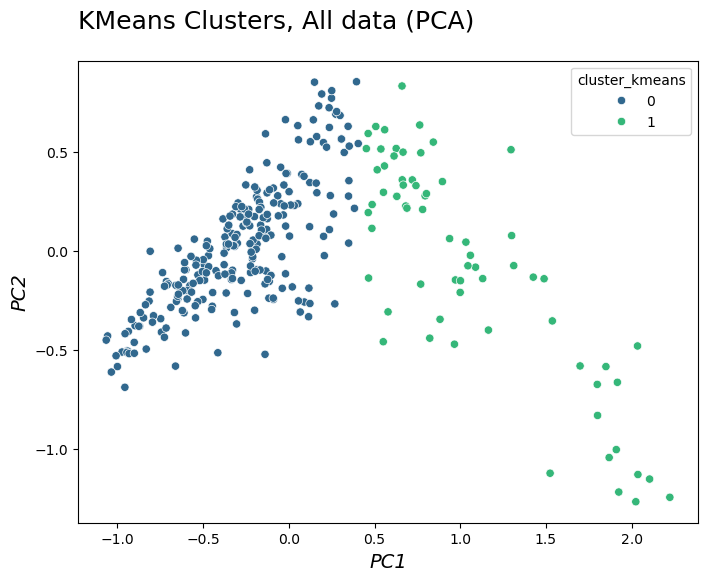

In [72]:
# Plot all data clusters over principal components
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_all_phys_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_kmeans', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters, All data (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

## Hierarchical

### Silhouette

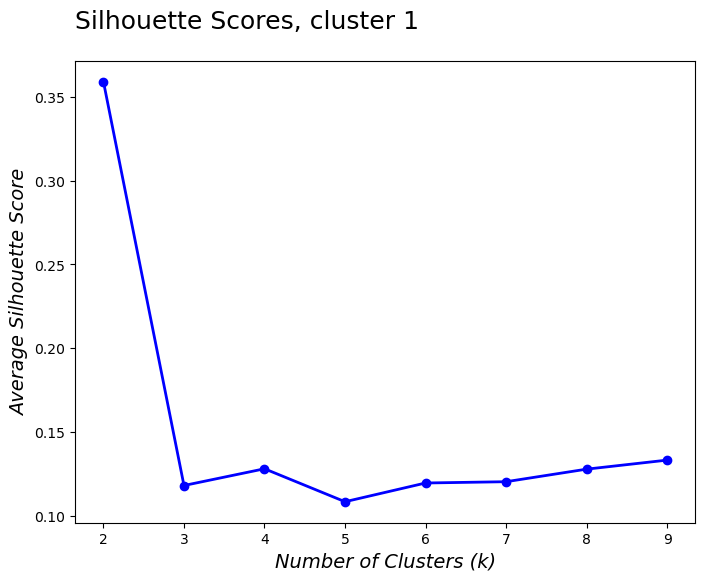

In [73]:
# Cluster 1
# Linkage matrix
Z1 = linkage(features_cluster1, method='ward')

sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    labels = fcluster(Z1, k, criterion='maxclust')
    score = silhouette_score(features_cluster1, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores, cluster 1', y=1.1, pad=-10, loc='left', size=18)

plt.show()

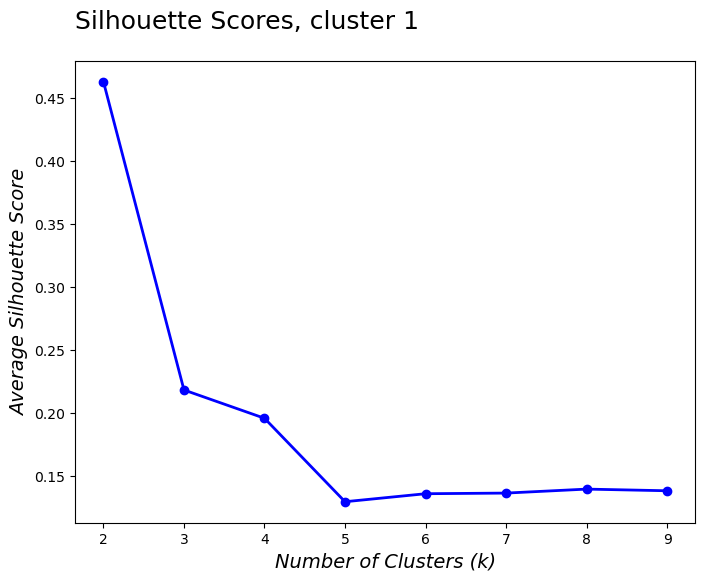

In [74]:
# Cluster 2
# Linkage matrix
Z2 = linkage(features_cluster2, method='ward')

sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    labels = fcluster(Z2, k, criterion='maxclust')
    score = silhouette_score(features_cluster2, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores, cluster 1', y=1.1, pad=-10, loc='left', size=18)

plt.show()

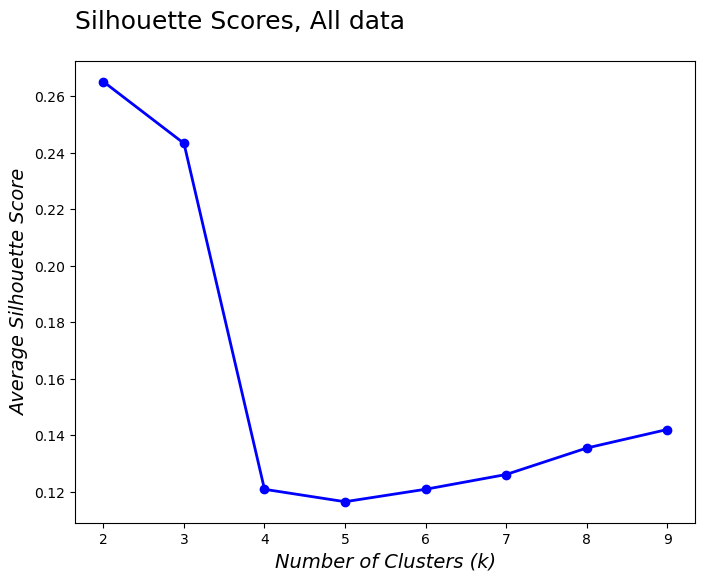

In [75]:
# All data
# Linkage matrix
ZAll = linkage(features_all, method='ward')

sil_scores = []
k_values = range(2, 10)

# Loop through k values
for k in k_values:
    labels = fcluster(ZAll, k, criterion='maxclust')
    score = silhouette_score(features_all, labels)
    sil_scores.append(score)

# Plot silhouette scores
fig, ax = plt.subplots(figsize=(8, 6))

ax = plt.plot(k_values, sil_scores, 'bo-', linewidth=2)
plt.ylabel("Average Silhouette Score", size = 14, fontstyle = 'italic')
plt.xlabel("Number of Clusters (k)", size = 14, fontstyle = 'italic')
plt.title('Silhouette Scores, All data', y=1.1, pad=-10, loc='left', size=18)

plt.show()

### Gap statistics

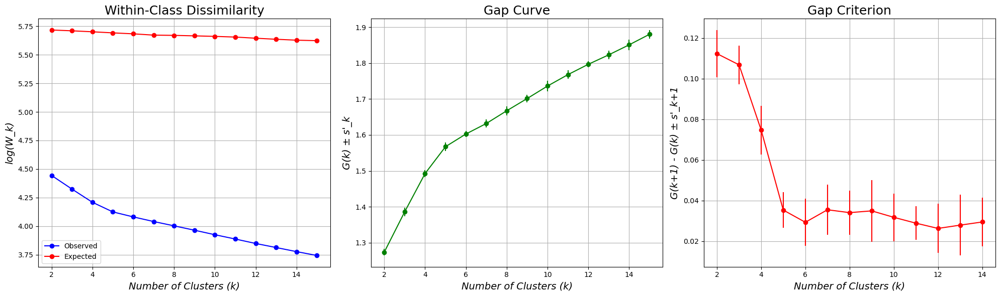

In [78]:
# Cluster 1
# Compute the gap statistics metrics
n_clusters = 15
hierach_model = HierarchicalModel(method = 'ward', criterion = 'maxclust')

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features_cluster1, n_clusters, references = 20, random_state = rdst, model = hierach_model)

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

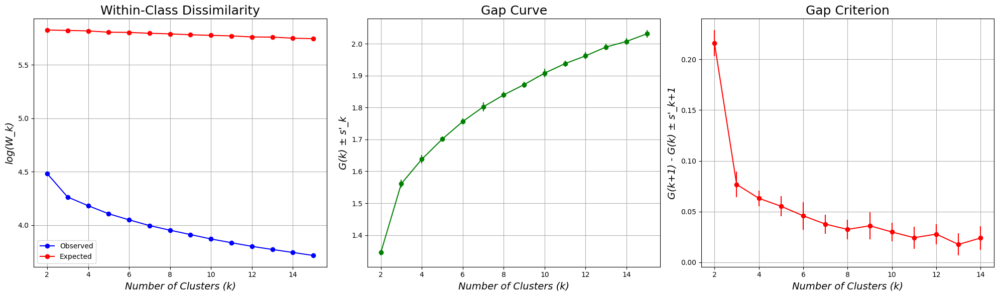

In [79]:
# Cluster 2
# Compute the gap statistics metrics
n_clusters = 15
hierach_model = HierarchicalModel(method = 'ward', criterion = 'maxclust')

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features_cluster2, n_clusters, references = 20, random_state = rdst, model = hierach_model)

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

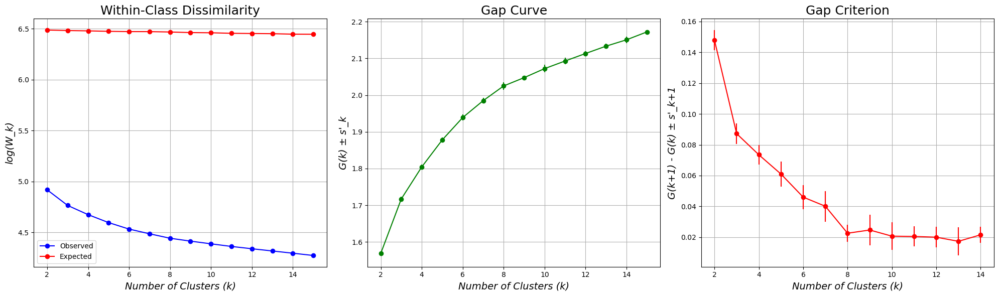

In [80]:
# All data
# Compute the gap statistics metrics
n_clusters = 15
hierach_model = HierarchicalModel(method = 'ward', criterion = 'maxclust')

(log_wk,
expected_log_wk,
gaps,
gap_diff,
s_k_ref,
s_prime_k,
k_1se) = gap_statistics(features_all, n_clusters, references = 20, random_state = rdst, model = hierach_model)

# Set up figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Within-Class Dissimilarity
axes[0].plot(range(2, n_clusters+1), log_wk, marker = 'o', color = 'b', label = 'Observed')
axes[0].plot(range(2, n_clusters+1), expected_log_wk, marker = 'o', color = 'r', label = 'Expected')
axes[0].set_title('Within-Class Dissimilarity', size = 18)
axes[0].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[0].set_ylabel('log(W_k)', size = 14, fontstyle = 'italic')
axes[0].grid(True)
axes[0].legend()

# Plot 2: Gap Curve
axes[1].errorbar(range(2, n_clusters+1), gaps, yerr=s_prime_k, fmt='o-', color='g', label='Gap Statistic')
axes[1].set_title('Gap Curve', size = 18)
axes[1].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[1].set_ylabel('G(k) ± s\'_k', size = 14, fontstyle = 'italic')
axes[1].grid(True)

# Plot 3: Gap Criterion
axes[2].errorbar(range(2, n_clusters), gap_diff, yerr=s_prime_k[1:], fmt='o-', color='r', label='Gap Criterion')
axes[2].set_title('Gap Criterion', size = 18)
axes[2].set_xlabel('Number of Clusters (k)', size = 14, fontstyle = 'italic')
axes[2].set_ylabel('G(k+1) - G(k) ± s\'_k+1', size = 14, fontstyle = 'italic')
axes[2].grid(True)

plt.tight_layout()
plt.show()

### Clustering

[]

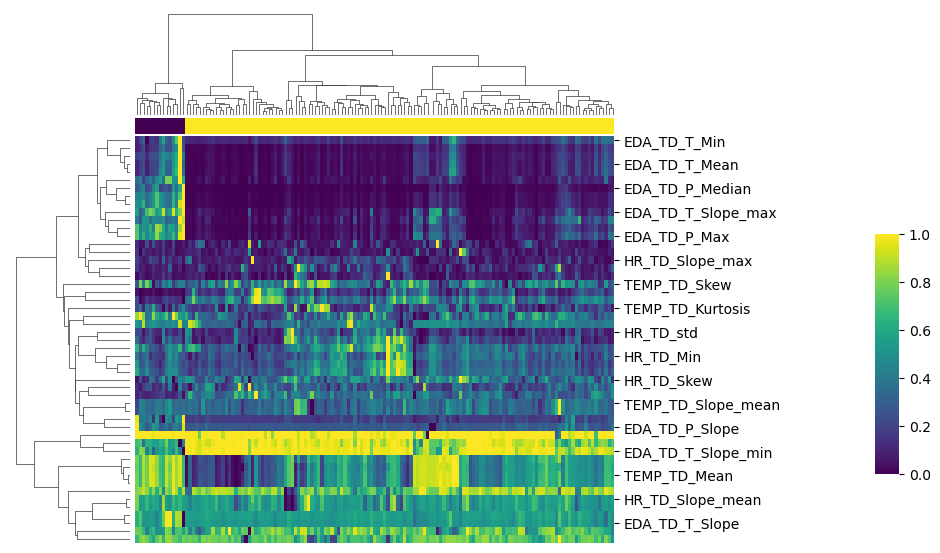

In [81]:
# Cluster 1
# Define optimal number of clusters and fit Hierarchical clustering
n_clusters = 2
labels = fcluster(Z1, n_clusters, criterion = 'maxclust')
normalized_cluster1_phys_data['cluster_hierarch'] = labels

# Create a color array based on the labels (one color per cluster)
colors = [plt.cm.get_cmap('viridis', n_clusters) (label-1) for label in labels]

# Plot heatmap with dendrograms
ax_heatmap = sn.clustermap(features_cluster1.T, cmap = 'viridis',
              col_linkage = Z1, col_colors = colors, row_cluster = True,
              figsize = (8, 6), cbar_pos = (1.1, .2, .03, .4))
ax_heatmap.ax_heatmap.set_xticks([])

[]

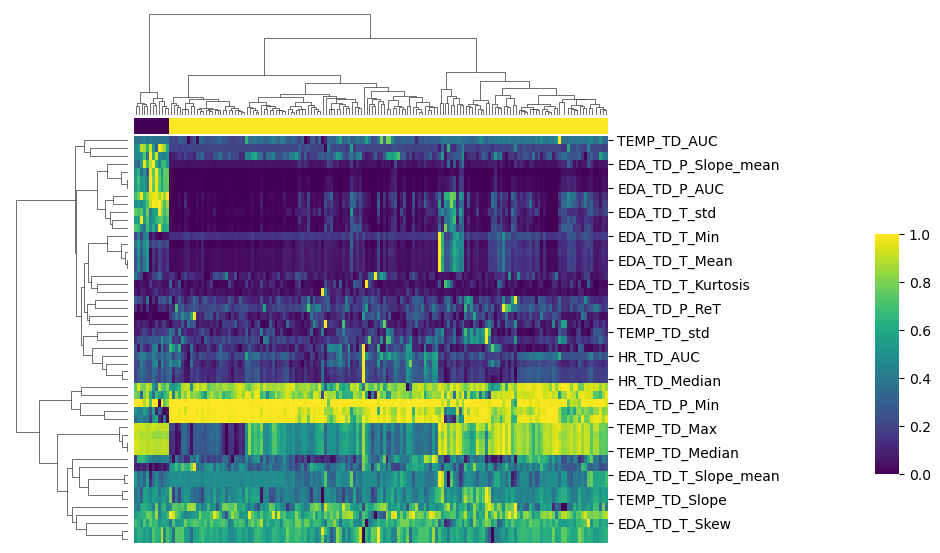

In [82]:
# Cluster 2
# Define optimal number of clusters and fit Hierarchical clustering
n_clusters = 2
labels = fcluster(Z2, n_clusters, criterion = 'maxclust')
normalized_cluster2_phys_data['cluster_hierarch'] = labels

# Create a color array based on the labels (one color per cluster)
colors = [plt.cm.get_cmap('viridis', n_clusters) (label-1) for label in labels]

# Plot heatmap with dendrograms
ax_heatmap = sn.clustermap(features_cluster2.T, cmap = 'viridis',
              col_linkage = Z2, col_colors = colors, row_cluster = True,
              figsize = (8, 6), cbar_pos = (1.1, .2, .03, .4))
ax_heatmap.ax_heatmap.set_xticks([])

[]

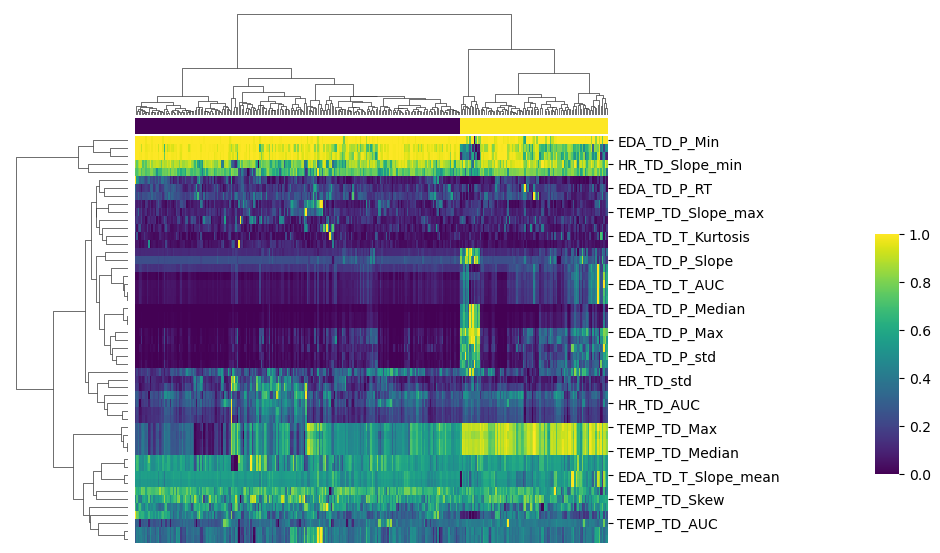

In [83]:
# All data
# Define optimal number of clusters and fit Hierarchical clustering
n_clusters = 2
labels = fcluster(ZAll, n_clusters, criterion = 'maxclust')
normalized_all_phys_data['cluster_hierarch'] = labels

# Create a color array based on the labels (one color per cluster)
colors = [plt.cm.get_cmap('viridis', n_clusters) (label-1) for label in labels]

# Plot heatmap with dendrograms
ax_heatmap = sn.clustermap(features_all.T, cmap = 'viridis',
              col_linkage = ZAll, col_colors = colors, row_cluster = True,
              figsize = (8, 6), cbar_pos = (1.1, .2, .03, .4))
ax_heatmap.ax_heatmap.set_xticks([])

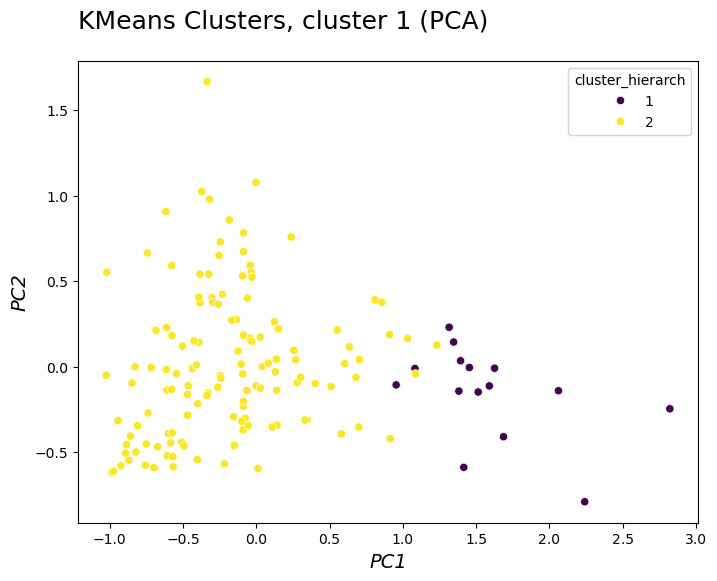

In [84]:
# Cluster 1
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_cluster1_phys_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_hierarch', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters, cluster 1 (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

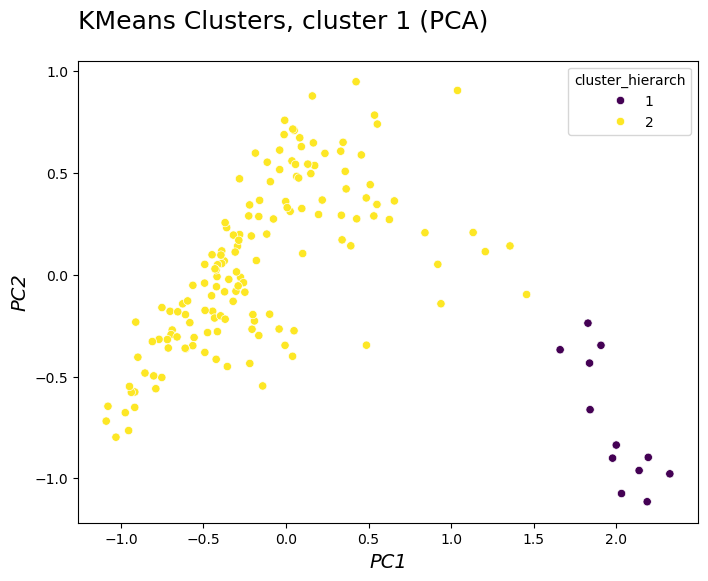

In [85]:
# Cluster 2
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_cluster2_phys_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_hierarch', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters, cluster 1 (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()

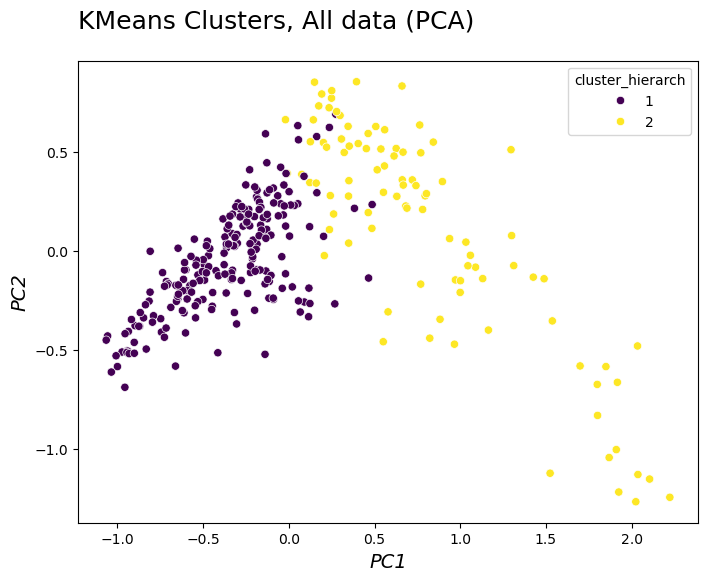

In [86]:
# All data
fig, ax = plt.subplots(figsize=(8, 6))

ax = sn.scatterplot(data = normalized_all_phys_data, x = 'PCA1', y = 'PCA2', hue = 'cluster_hierarch', palette = 'viridis')
ax.set_xlabel('PC1', size = 14, fontstyle = 'italic')
ax.set_ylabel('PC2', size = 14, fontstyle = 'italic')
ax.set_title('KMeans Clusters, All data (PCA)', y=1.1, pad=-10, loc='left', size=18)

plt.show()